In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
import pandas as pd
from pandas import ExcelWriter
from pandas import ExcelFile
from scipy import stats

%matplotlib inline

TRUE DATA

In [93]:
name = '2020_LER_20200804_V006.xlsx'
datatype = 'n'

dataset = get_dataset(name, datatype)

# y mean and std
y_mean = np.mean(dataset.train_Y, axis=0, dtype=np.float32)
y_std = np.std(dataset.train_Y, axis=0, dtype=np.float32)

real = dataset.test_Y


============ Data load =============
X data shape:  (10000, 5) X per cycle data shape: (200, 5)
Y data shape:  (10000, 6) Y per cycle data shape: (200, 6)
any nan in X?:  []
any nan in Y?:  [[4450    0]
 [4450    1]
 [4450    2]
 ...
 [9999    3]
 [9999    4]
 [9999    5]]
Same number of x data and y data
============= Data split ==============
train X: (3750, 5) train Y: (3750, 6)
val X: (500, 5) val Y: (500, 6)
test X: (750, 5) test Y: (750, 6)
x mean, std:  [  0.41795138  51.47284    122.14498      1.           0.        ] [ 0.20212363 27.062914   51.619465    0.          0.        ]
y mean, std:  [2.2068280e-12 4.1595627e-05 1.6299980e-05 3.4310421e-01 3.5104963e-01
 6.1669216e+01] [7.7416974e-13 2.1877843e-06 8.3063077e-07 7.4241282e-03 6.6630146e-03
 3.2903570e-01]
Same number of x data and y data
============= Data split ==============
train X: (75, 5) train Y: (75, 6)
val X: (10, 5) val Y: (10, 6)
test X: (15, 5) test Y: (15, 6)
x mean, std:  [  0.41795373  51.47359    122.1460

In [94]:
print(real.shape)
for i in range(350, 400):
    print(real[i,:])

(750, 6)
[1.5280e-12 3.8530e-05 1.5020e-05 3.5000e-01 3.5600e-01 6.1336e+01]
[1.277e-12 3.960e-05 1.461e-05 3.520e-01 3.610e-01 6.117e+01]
[2.3120e-12 4.2700e-05 1.6640e-05 3.4000e-01 3.4800e-01 6.1569e+01]
[3.0290e-12 4.2900e-05 1.7040e-05 3.3700e-01 3.4500e-01 6.2238e+01]
[3.4980e-12 4.3750e-05 1.7710e-05 3.3300e-01 3.4300e-01 6.2312e+01]
[2.1970e-12 4.0340e-05 1.6170e-05 3.4200e-01 3.4900e-01 6.1641e+01]
[2.0330e-12 3.9400e-05 1.5270e-05 3.4500e-01 3.5300e-01 6.1787e+01]
[4.3100e-12 4.1970e-05 1.7030e-05 3.2800e-01 3.4000e-01 6.2408e+01]
[2.3840e-12 4.2710e-05 1.6470e-05 3.3900e-01 3.4700e-01 6.1581e+01]
[2.6250e-12 4.1670e-05 1.6850e-05 3.3900e-01 3.4800e-01 6.1926e+01]
[1.7720e-12 4.0220e-05 1.5480e-05 3.4500e-01 3.5300e-01 6.1375e+01]
[1.5340e-12 4.2310e-05 1.5680e-05 3.4800e-01 3.5600e-01 6.1253e+01]
[3.2490e-12 4.3220e-05 1.7980e-05 3.3400e-01 3.4300e-01 6.2143e+01]
[2.3430e-12 4.0020e-05 1.6170e-05 3.4200e-01 3.4800e-01 6.1845e+01]
[2.0430e-12 4.1750e-05 1.6380e-05 3.4400e-01 

In [95]:
# base gan
# total_name = 'total_date__data_n_model_mlp_gan1_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'


# # base wgan : 
# total_name = 'total_date__data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'

# # wgan : noise_d 200 #증가별로
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_200_sample_num_50.npy'

# # wgan : hidden_dim 200 #증가 굳
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_200_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'

# # wgan : d_lr 0.001 #증가별로
# total_name = 'totabsal_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.001_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'

# # wgan : g_lr 0.0005 #증가별로
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0005_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'

# # wgan : 배치 128 #증가별로
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_128_epoch_1000_200_noise_d_100_sample_num_50.npy'

# wgan : epoch 400 #증가별로
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_400_noise_d_100_sample_num_50.npy'

# wgan : noise_d 50 #감소 굳
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_50_sample_num_50.npy'

# wgan : hidden_dim 50 #감소 별로
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'

# wgan : lr_d 0.0001 #감소 별로
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0001_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'

# wgan : lr_g 0.0005 #감소 굳
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_5e-05_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'

# wgan : 좋은거 조합 별로
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_16_epoch_1000_200_noise_d_100_sample_num_50.npy'

# wgan : hidden dim 300 증가
# total_name = 'total_date_20200825_data_n_model_mlp_wgan_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_300_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'


#python3 main_gan.py --date "20200902" --dataset "2020_LER_20200804_V006.xlsx" --data_type "n" --trainer 'gan' --mean_model_type 'mlp' --gan_model_type 'gan1' --gan_hidden_dim 500
#python3 main_gan.py --date "20200902" --dataset "2020_LER_20200804_V006.xlsx" --data_type "n" --trainer 'gan' --mean_model_type 'mlp' --gan_model_type 'gan1' --gan_hidden_dim 1000
#python3 main_gan.py --date "20200902" --dataset "2020_LER_20200804_V006.xlsx" --data_type "n" --trainer 'gan' --mean_model_type 'mlp' --gan_model_type 'gan1' --gan_hidden_dim 5000 
#python3 main_gan.py --date "20200902" --dataset "2020_LER_20200804_V006.xlsx" --data_type "n" --trainer 'gan' --mean_model_type 'mlp' --gan_model_type 'gan1' --gan_hidden_dim 500 --sample_num 150
#python3 main_gan.py --date "20200902" --dataset "2020_LER_20200804_V006.xlsx" --data_type "n" --trainer 'gan' --mean_model_type 'mlp' --gan_model_type 'gan1' --gan_hidden_dim 1000 --sample_num 150
#python3 main_gan.py --date "20200902" --dataset "2020_LER_20200804_V006.xlsx" --data_type "n" --trainer 'gan' --mean_model_type 'mlp' --gan_model_type 'gan1' --gan_hidden_dim 5000 --sample_num 150

# 'total_date_20200909_data_n_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_50.npy'

# 0823 #0902 0905
total_name = 'prev_results/total_date_20200909_data_n_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_150_pdrop_0.8.npy'
total_result = np.load(total_name, allow_pickle=True)

In [25]:
print(total_result[350:400])
print(real[factor * 50:(factor+1)*50])

[[1.61090829e-12 4.36472856e-05 1.65552361e-05 3.52561232e-01
  3.59613577e-01 6.16641102e+01]
 [1.27747357e-12 3.33024436e-05 1.43103180e-05 3.64823854e-01
  3.72154955e-01 6.13482051e+01]
 [2.59813430e-12 4.50058255e-05 1.74665455e-05 3.38528032e-01
  3.48256343e-01 6.19997994e+01]
 [2.48547810e-12 4.10189855e-05 1.62670744e-05 3.39904279e-01
  3.48378241e-01 6.19588065e+01]
 [3.13623021e-12 4.19476663e-05 1.69530459e-05 3.36151744e-01
  3.45610701e-01 6.20801795e+01]
 [1.02563422e-12 3.17022968e-05 1.31476402e-05 3.78917303e-01
  3.87137569e-01 6.10454618e+01]
 [9.38539394e-13 3.69163356e-05 1.47948153e-05 3.62101620e-01
  3.69603360e-01 6.12251296e+01]
 [2.42158749e-12 3.83880583e-05 1.51726161e-05 3.42283101e-01
  3.50608302e-01 6.18398657e+01]
 [2.05995076e-12 4.49709128e-05 1.69740630e-05 3.45367419e-01
  3.54328463e-01 6.18293481e+01]
 [2.22743830e-12 4.25031192e-05 1.66615863e-05 3.42432608e-01
  3.51043587e-01 6.18921452e+01]
 [1.49258812e-12 3.85541009e-05 1.53628336e-05 3.5

In [45]:
import pandas as pd
import numpy as np

sample_num = int(len(total_result)/15)

#factor 2 3 7 12 14
factor = 12

# check sparsity

print(dataset.test_X_per_cycle[factor])


# start = 50 * factor
# end = 50 * (factor+1)

# plt.scatter(dataset.test_Y[start:end,0],dataset.test_Y[start:end,2], label='real')
# plt.xlim(5e-12, 1e-13)
# plt.ylim(1e-5, 2e-5)
# plt.legend(loc='lower left', fontsize=12)
# plt.xlabel("Ioff", fontsize=20)
# plt.ylabel("IDlin", fontsize=20)
# plt.show()

print(dataset.test_Y[start:end])

# generated sample
gan_matrix_plot = total_result[factor * sample_num:(factor+1)*sample_num]
print(gan_matrix_plot.shape)

# real sample
real_matrix_plot = real[factor * 50:(factor+1)*50]
print(real_matrix_plot.shape)

# making class(generated: 0, real:1 ) for visualization
gan_cls = np.zeros((sample_num, 1))
print(gan_cls.shape)
real_cls = np.ones((50, 1))
print(real_cls.shape)

temp1 = np.hstack([gan_matrix_plot, gan_cls])
temp2 = np.hstack([real_matrix_plot, real_cls])

# TOTAL PANDAS DATA
total_matrix_plot = np.vstack([temp1, temp2])
print(total_matrix_plot.shape)

# A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
df1 = pd.DataFrame(total_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
print(df1)




[ 0.56045148 25.42868151 69.39740975  1.          0.        ]
[[1.4350e-12 3.6300e-05 1.4880e-05 3.5200e-01 3.5800e-01 6.1431e+01]
 [1.6570e-12 4.2440e-05 1.6310e-05 3.4800e-01 3.5400e-01 6.1429e+01]
 [1.7230e-12 3.9900e-05 1.5360e-05 3.4900e-01 3.5600e-01 6.1723e+01]
 [1.6220e-12 3.8810e-05 1.5640e-05 3.5100e-01 3.5700e-01 6.1756e+01]
 [4.2170e-12 4.3360e-05 1.8010e-05 3.3000e-01 3.4000e-01 6.2543e+01]
 [2.6060e-12 4.3030e-05 1.7060e-05 3.3800e-01 3.4700e-01 6.1920e+01]
 [3.7990e-12 4.3290e-05 1.7590e-05 3.3200e-01 3.4200e-01 6.2466e+01]
 [1.3260e-12 4.1470e-05 1.5400e-05 3.5200e-01 3.5900e-01 6.1215e+01]
 [1.7950e-12 4.1300e-05 1.5470e-05 3.4800e-01 3.5500e-01 6.1808e+01]
 [4.9080e-12 4.2800e-05 1.7490e-05 3.2800e-01 3.3800e-01 6.2878e+01]
 [1.8030e-12 3.7540e-05 1.5340e-05 3.4800e-01 3.5400e-01 6.1606e+01]
 [1.4470e-12 3.9600e-05 1.4740e-05 3.5100e-01 3.6200e-01 6.1430e+01]
 [2.6310e-12 4.2760e-05 1.6310e-05 3.3900e-01 3.4700e-01 6.1889e+01]
 [7.7630e-13 3.6560e-05 1.5400e-05 3.6600

In [46]:
#print(total_result)
print('FID_score', FID_score((total_result-y_mean) / y_std, (real - y_mean) / y_std))
score, FID_score_list = FID_score_each_X((total_result-y_mean) / y_std, (real - y_mean) / y_std, num_in_gen=50, num_in_cycle=50)
print('FID_score_each_X', score)

FID_score 0.2645062995822356
FID_score_each_X 3.8581255561543903


FEATURE DISTRIBUTION



[7.76300000e-13 3.20500000e-05 1.29000000e-05 3.23964896e-01
 3.35679350e-01 6.09510000e+01 0.00000000e+00] [6.08490363e-12 4.56565690e-05 1.83727573e-05 3.72863004e-01
 3.79860792e-01 6.31045139e+01 1.00000000e+00]
(5,)
(15, 5)
[ 0.56045148 25.42868151 69.39740975  1.          0.        ]


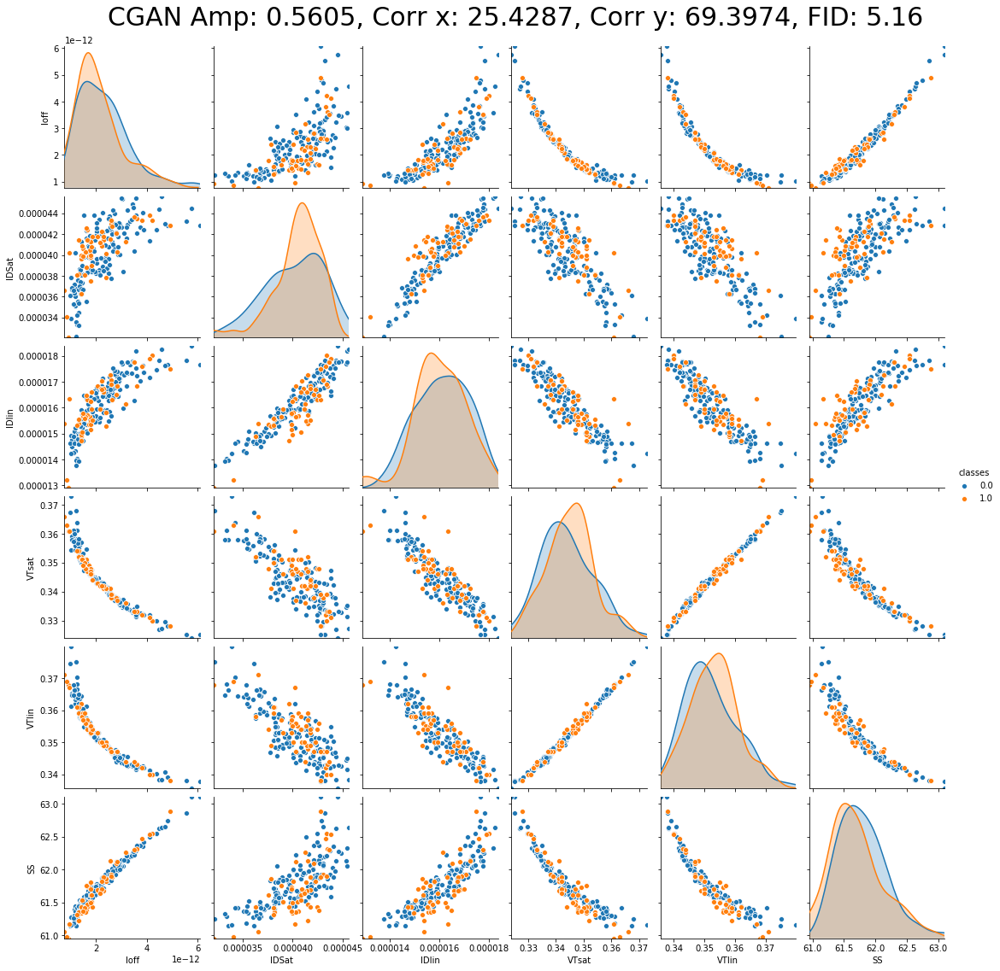

In [47]:
import seaborn as sns

min_list = total_matrix_plot.min(axis=0)
max_list = total_matrix_plot.max(axis=0)
print(min_list, max_list)
X = dataset.test_X_per_cycle[factor]
print(X.shape)
print(dataset.test_X_per_cycle.shape)

print(X)

g = sns.pairplot(df1, hue = 'classes')
for i in range(6):
    g.fig.suptitle("CGAN Amp: {:.4f}, Corr x: {:.4f}, Corr y: {:.4f}, FID: {:.2f}".format(X[0], X[1], X[2], FID_score_list[factor]), y=1.04, fontsize=30)
    g.axes[i,i].set_xlim((min_list[i],max_list[i]))
    g.axes[i,i].set_ylim((min_list[i],max_list[i]))
plt.show()

SCATTER PLOT two variable

check sample_num:  150


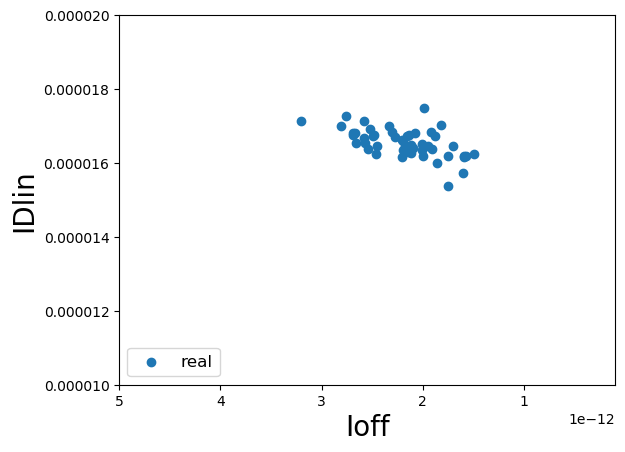

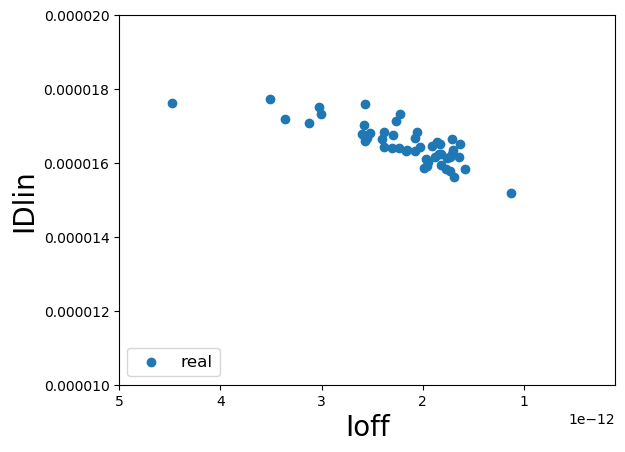

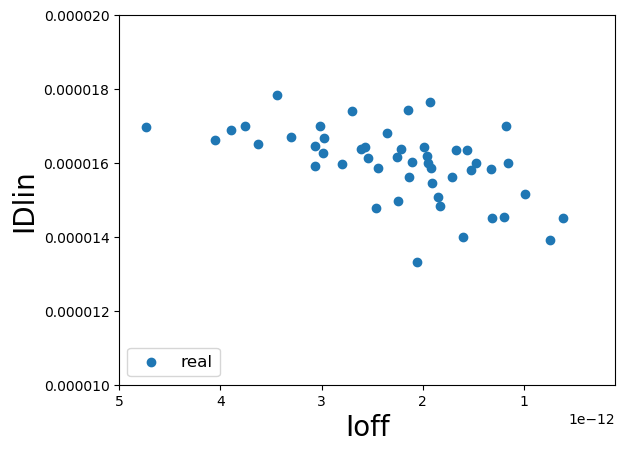

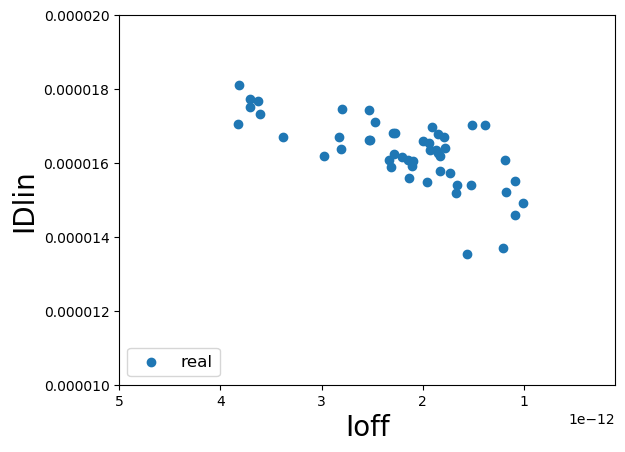

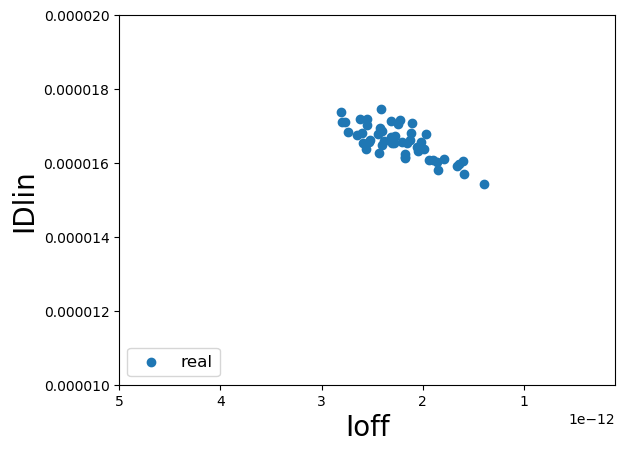

...

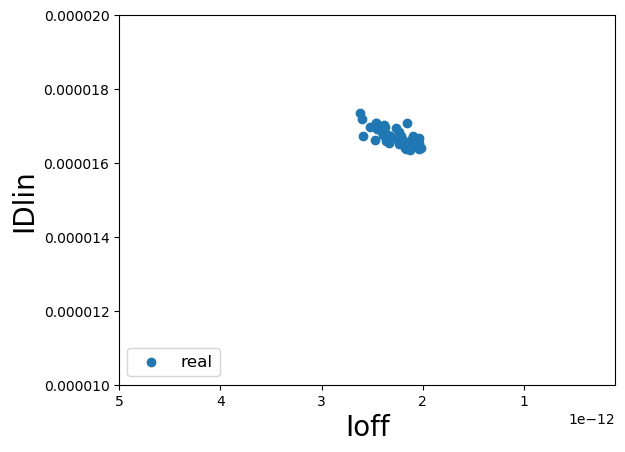

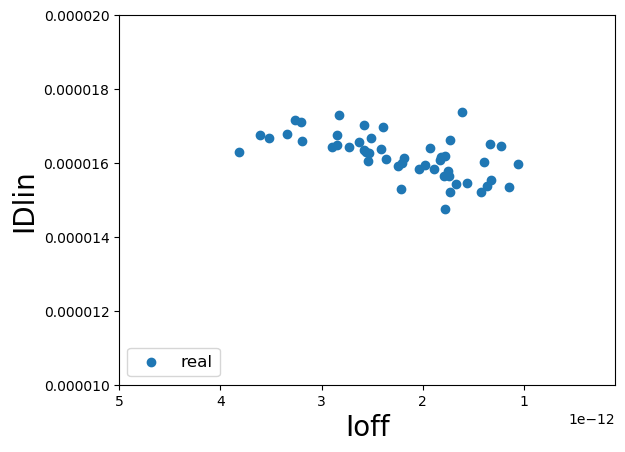

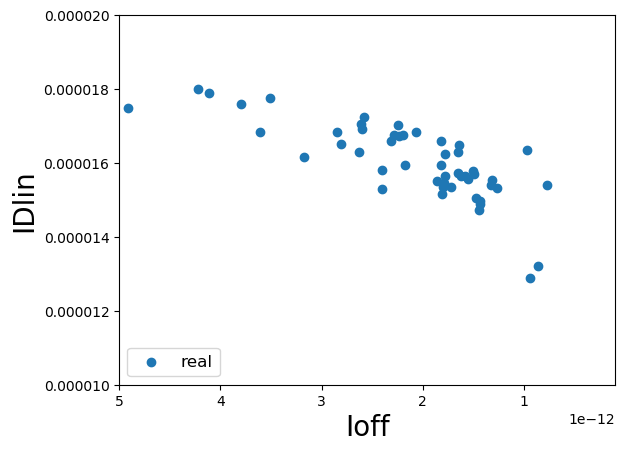

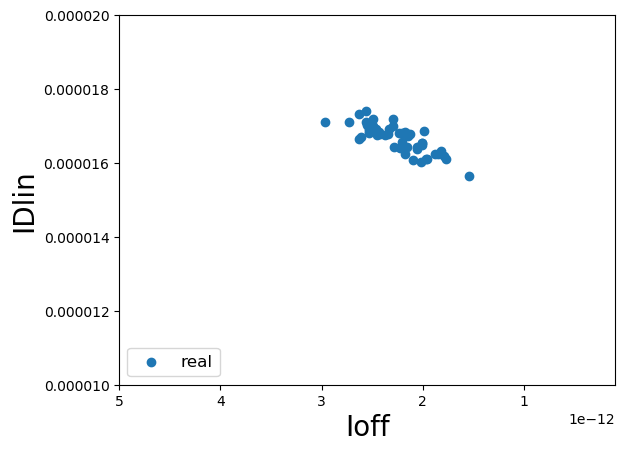

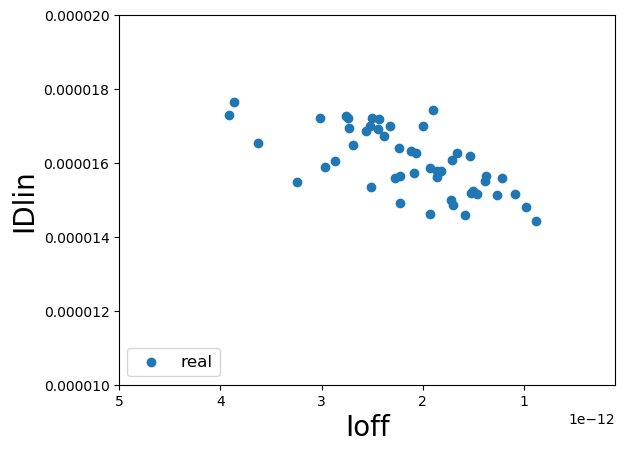

In [316]:
# ( Ioff / IDlin )

print("check sample_num: ", int(len(total_result)/15))
sample_num = int(len(total_result)/15)

factor = sample_num // 50
for idx in range(15):
    start = 50 * idx
    end = 50 * (idx+1)
#    plt.scatter(total_result[start*factor:end*factor,0],total_result[start*factor:end*factor,2], label='gan_generated')
    plt.scatter(real[start:end,0],real[start:end,2], label='real')
    plt.xlim(5e-12, 1e-13)
    plt.ylim(1e-5, 2e-5)
    plt.legend(loc='lower left', fontsize=12)
    plt.xlabel("Ioff", fontsize=20)
    plt.ylabel("IDlin", fontsize=20)
    plt.show()

check sample_num:  150


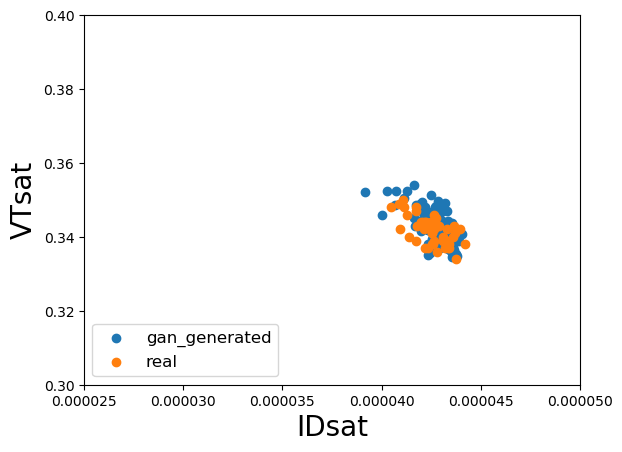

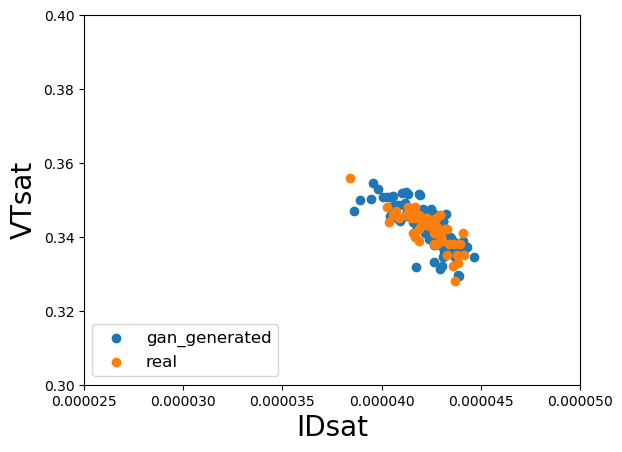

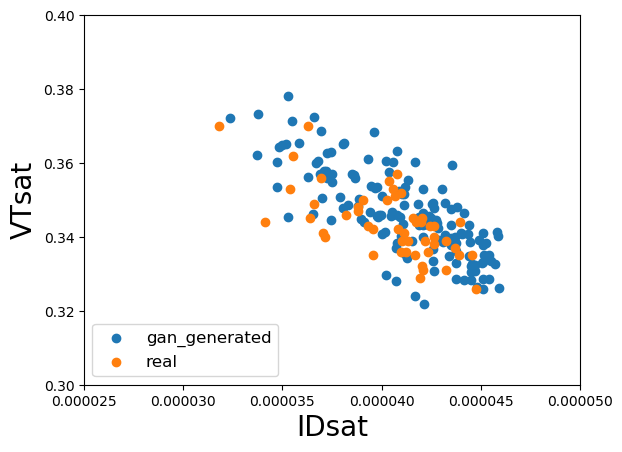

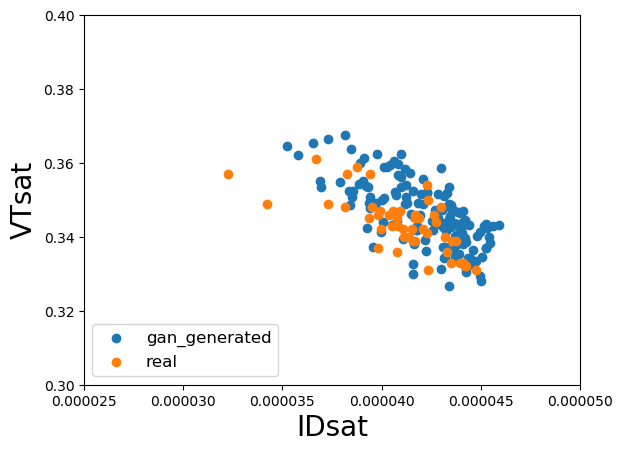

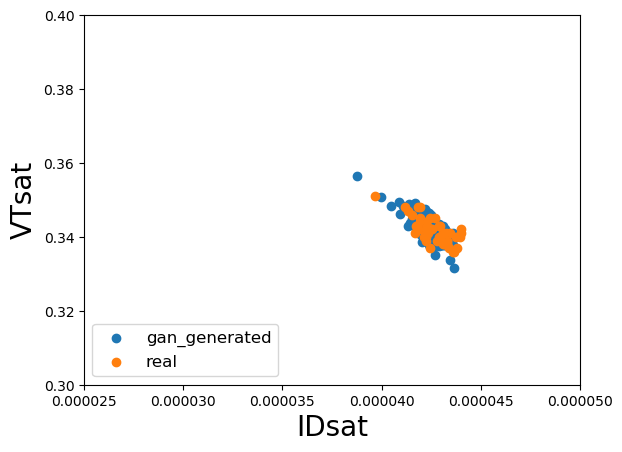

...

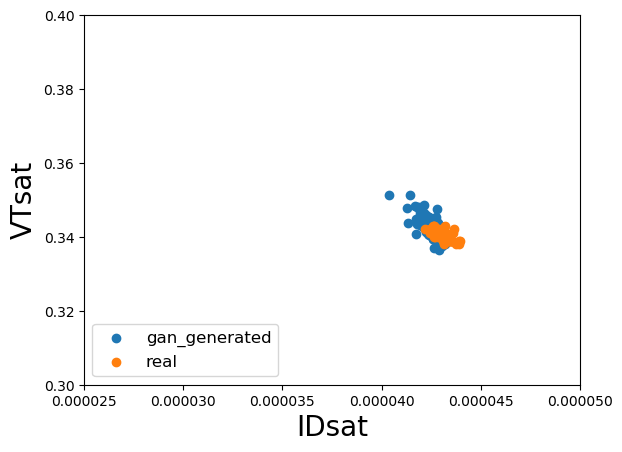

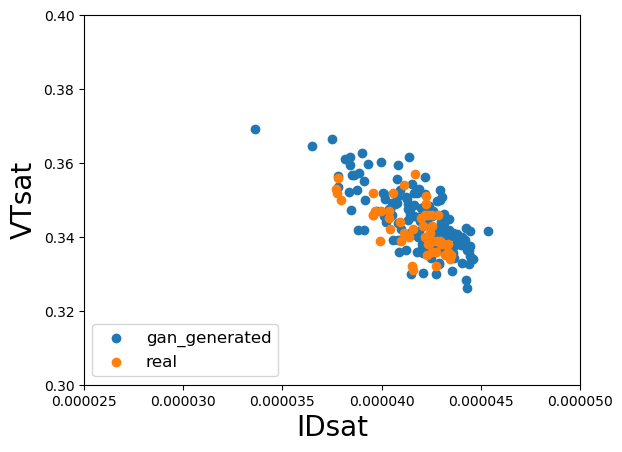

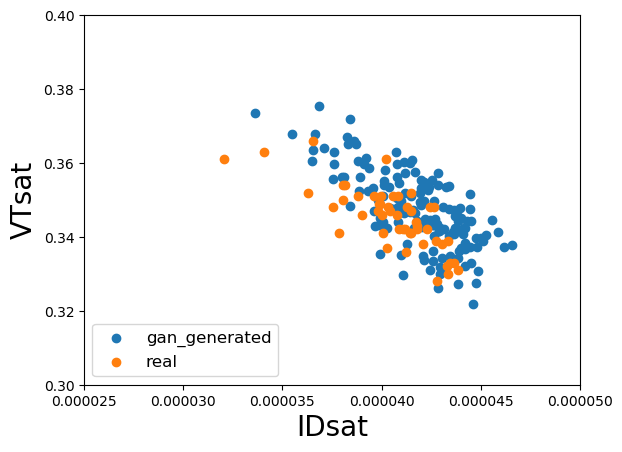

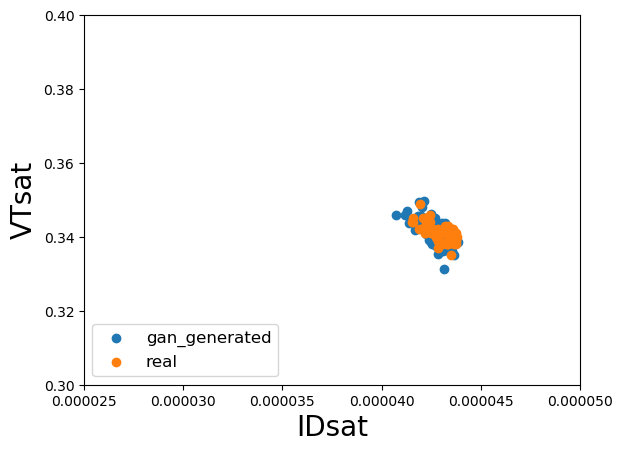

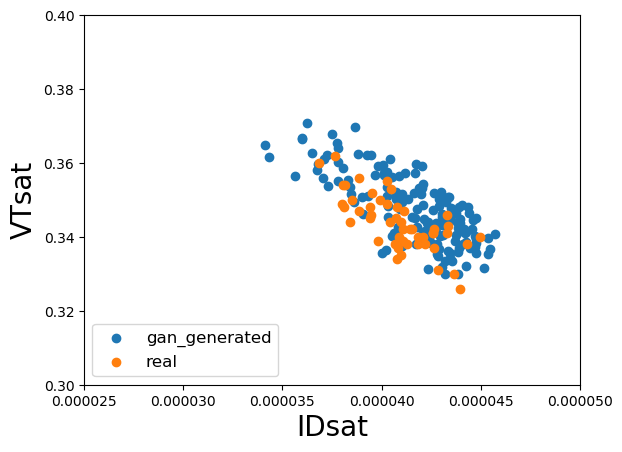

In [14]:
# ( IDsat / VTsat )

print("check sample_num: ", int(len(total_result)/15))
sample_num = int(len(total_result)/15)

factor = sample_num // 50
for idx in range(15):
    start = 50 * idx
    end = 50 * (idx+1)
    plt.scatter(total_result[start*factor:end*factor,1],total_result[start*factor:end*factor,3], label='gan_generated')
    plt.scatter(real[start:end,1],real[start:end,3], label='real')
    plt.xlim(2.5e-5, 5e-5)
    plt.ylim(3e-1, 4e-1)
    plt.legend(loc='lower left', fontsize=12)
    plt.xlabel("IDsat", fontsize=20)
    plt.ylabel("VTsat", fontsize=20)
    plt.show()

# FUCKING DEBUGING


In [ ]:
# 1. old dataset
# 2. new dataset
# 3. generated result


In [102]:
name = '2020_LER_20200804_V006.xlsx'

dataset = get_dataset(name, datatype)

# y mean and std
y_mean = np.mean(dataset.train_Y, axis=0, dtype=np.float32)
y_std = np.std(dataset.train_Y, axis=0, dtype=np.float32)

real_old = dataset.test_Y

============ Data load =============
X data shape:  (10000, 5) X per cycle data shape: (200, 5)
Y data shape:  (10000, 6) Y per cycle data shape: (200, 6)
any nan in X?:  []
any nan in Y?:  [[4450    0]
 [4450    1]
 [4450    2]
 ...
 [9999    3]
 [9999    4]
 [9999    5]]
Same number of x data and y data
============= Data split ==============
train X: (3750, 5) train Y: (3750, 6)
val X: (500, 5) val Y: (500, 6)
test X: (750, 5) test Y: (750, 6)
x mean, std:  [  0.41795138  51.47284    122.14498      1.           0.        ] [ 0.20212363 27.062914   51.619465    0.          0.        ]
y mean, std:  [2.2068280e-12 4.1595627e-05 1.6299980e-05 3.4310421e-01 3.5104963e-01
 6.1669216e+01] [7.7416974e-13 2.1877843e-06 8.3063077e-07 7.4241282e-03 6.6630146e-03
 3.2903570e-01]
Same number of x data and y data
============= Data split ==============
train X: (75, 5) train Y: (75, 6)
val X: (10, 5) val Y: (10, 6)
test X: (15, 5) test Y: (15, 6)
x mean, std:  [  0.41795373  51.47359    122.1460

In [103]:
file_path = '../2020_LER_20200922_testset.xlsx'

data = np.load(file_path+'.npy', allow_pickle=True)
num_in_cycle = [232, 289, 277, 253, 255] 
num_of_cycle = 5
    
X_all, Y_all, X_per_cycle, Y_per_cycle = data[0], data[1], data[2], data[3]

real_new = Y_all

In [104]:
print("old data: ", real_old.shape)
print("new data: ", real_new.shape)

old_factor = 7
new_factor = 2

real_old = real_old[old_factor*50:old_factor*50+50]
print(sum(num_in_cycle[:new_factor]),sum(num_in_cycle[:new_factor])+num_in_cycle[new_factor])
real_new = real_new[sum(num_in_cycle[:new_factor]):sum(num_in_cycle[:new_factor])+num_in_cycle[new_factor]]
real_new_50 = real_new[:50]

print("old data: ", real_old.shape)
print("new data: ", real_new.shape)
print("new 50 data: ", real_new_50.shape)


old data:  (750, 6)
new data:  (1306, 6)
521 798
old data:  (50, 6)
new data:  (277, 6)
new 50 data:  (50, 6)


In [105]:
for i in range(len(real_old)):
    print(real_old[i], real_new[i])

[1.5280e-12 3.8530e-05 1.5020e-05 3.5000e-01 3.5600e-01 6.1336e+01] [1.5280e-12 3.8530e-05 1.5020e-05 3.5000e-01 3.5600e-01 6.1336e+01]
[1.277e-12 3.960e-05 1.461e-05 3.520e-01 3.610e-01 6.117e+01] [1.277e-12 3.960e-05 1.461e-05 3.520e-01 3.610e-01 6.117e+01]
[2.3120e-12 4.2700e-05 1.6640e-05 3.4000e-01 3.4800e-01 6.1569e+01] [2.3120e-12 4.2700e-05 1.6640e-05 3.4000e-01 3.4800e-01 6.1569e+01]
[3.0290e-12 4.2900e-05 1.7040e-05 3.3700e-01 3.4500e-01 6.2238e+01] [3.0290e-12 4.2900e-05 1.7040e-05 3.3700e-01 3.4500e-01 6.2238e+01]
[3.4980e-12 4.3750e-05 1.7710e-05 3.3300e-01 3.4300e-01 6.2312e+01] [3.4980e-12 4.3750e-05 1.7710e-05 3.3300e-01 3.4300e-01 6.2312e+01]
[2.1970e-12 4.0340e-05 1.6170e-05 3.4200e-01 3.4900e-01 6.1641e+01] [2.1970e-12 4.0340e-05 1.6170e-05 3.4200e-01 3.4900e-01 6.1641e+01]
[2.0330e-12 3.9400e-05 1.5270e-05 3.4500e-01 3.5300e-01 6.1787e+01] [2.0330e-12 3.9400e-05 1.5270e-05 3.4500e-01 3.5300e-01 6.1787e+01]
[4.3100e-12 4.1970e-05 1.7030e-05 3.2800e-01 3.4000e-01 6.24

(750, 6)
Generated sample shape: (150, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (150, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.133e-12 3.768e-05 1.461e-05 3.280e-01 3.400e-01 6.117e+01 0.000e+00]
maximum y value for each varaible: [4.4550e-12 4.4100e-05 1.8040e-05 3.5700e-01 3.6300e-01 6.2744e+01
 1.0000e+00]


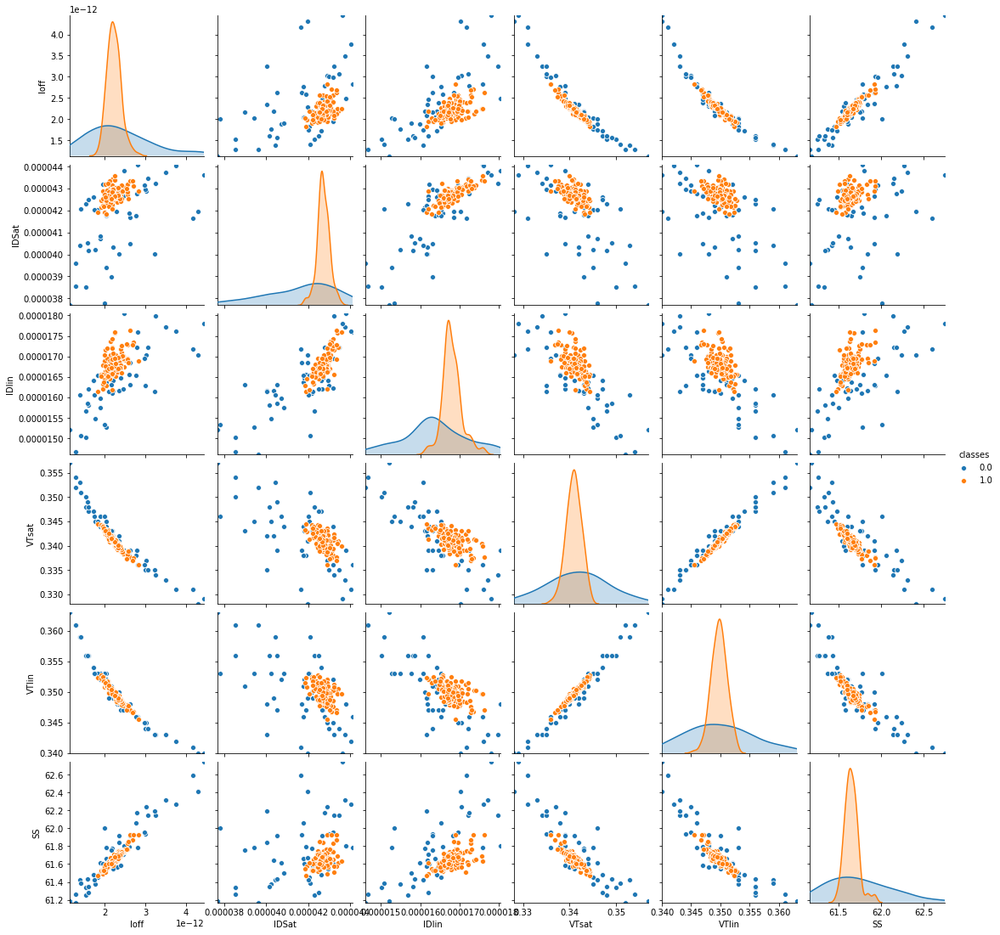

In [131]:
# result = 'total_date_20201017_data_n_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_150_pdrop_0.8.npy'
result = 'test_specificdate_20201018_data_2020_LER_20201008_V008.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_150_pdrop_0.8.npy'

total_result_test = np.load(result, allow_pickle=True)

print(total_result_test.shape)

# gen_factor = 7
# test_sample_num = int(total_result_test.shape[0]/15)
# test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]

gen_factor = 2
test_sample_num = int(total_result_test.shape[0]/5)
test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]
print("Generated sample shape:", test_gan_matrix_plot.shape)

# test_real_matrix_plot = real_test[sum(num_in_cycle[:real_factor]):sum(num_in_cycle[:real_factor])+num_in_cycle[real_factor]]
test_real_matrix_plot = real_old
print("real sample shape:", test_real_matrix_plot.shape)
print()

# Assigning class(generated: 0, real:1 ) for visualization

print("Assigning class for visualization (generated: 0, real:1 )")

test_gan_cls = np.ones((test_sample_num, 1))
print("generated sample class shape:", test_gan_cls.shape)
# test_real_cls = np.zeros((num_in_cycle[real_factor], 1))
test_real_cls = np.zeros((real_old.shape[0], 1))
print("real sample class shape:", test_real_cls.shape)


test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    
test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    
# TOTAL PANDAS DATA
    
total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    
# print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)

#    print(df1_test)
    
        # min, max for generated Y value ( used for scatter plot limit standard )

test_min_list = total_test_matrix_plot.min(axis=0)
test_max_list = total_test_matrix_plot.max(axis=0)
print("minimum y value for each varaible:", test_min_list)
print("maximum y value for each varaible:", test_max_list)


g = sns.pairplot(df1_test, hue = 'classes')
for i in range(6):
    g.axes[i,i].set_xlim((test_min_list[i],test_max_list[i]))
    g.axes[i,i].set_ylim((test_min_list[i],test_max_list[i]))
plt.show()


(7500, 6)
Generated sample shape: (500, 6)
real sample shape: (277, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (500, 1)
real sample class shape: (277, 1)
minimum y value for each varaible: [4.26637675e-13 2.95960372e-05 1.29258847e-05 3.23668608e-01
 3.36060241e-01 6.08514422e+01 0.00000000e+00]
maximum y value for each varaible: [6.97901090e-12 4.54035758e-05 1.86234968e-05 3.80200543e-01
 3.84909268e-01 6.33711010e+01 1.00000000e+00]


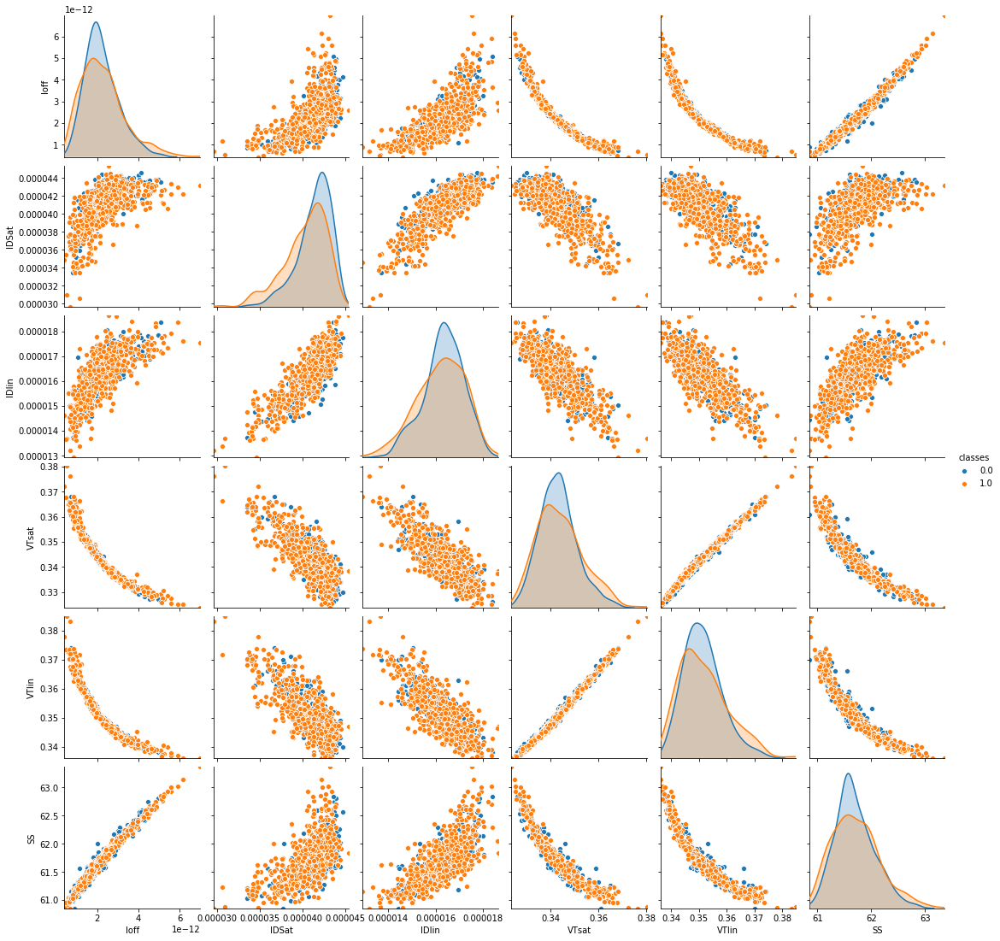

In [130]:
# result = 'total_date_20201017_data_n_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_150_pdrop_0.8.npy'
result = 'test_specificdate_20201018_data_n_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_500_pdrop_0.8.npy'
total_result_test = np.load(result, allow_pickle=True)

print(total_result_test.shape)

gen_factor = 7
test_sample_num = int(total_result_test.shape[0]/15)
test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]

# gen_factor = 2
# test_sample_num = int(total_result_test.shape[0]/5)
# test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]
print("Generated sample shape:", test_gan_matrix_plot.shape)

# test_real_matrix_plot = real_test[sum(num_in_cycle[:real_factor]):sum(num_in_cycle[:real_factor])+num_in_cycle[real_factor]]
test_real_matrix_plot = real_new
print("real sample shape:", test_real_matrix_plot.shape)
print()

# Assigning class(generated: 0, real:1 ) for visualization

print("Assigning class for visualization (generated: 0, real:1 )")

test_gan_cls = np.ones((test_sample_num, 1))
print("generated sample class shape:", test_gan_cls.shape)
# test_real_cls = np.zeros((num_in_cycle[real_factor], 1))
test_real_cls = np.zeros((real_new.shape[0], 1))
print("real sample class shape:", test_real_cls.shape)


test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    
test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    
# TOTAL PANDAS DATA
    
total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    
# print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)

#    print(df1_test)
    
        # min, max for generated Y value ( used for scatter plot limit standard )

test_min_list = total_test_matrix_plot.min(axis=0)
test_max_list = total_test_matrix_plot.max(axis=0)
print("minimum y value for each varaible:", test_min_list)
print("maximum y value for each varaible:", test_max_list)


g = sns.pairplot(df1_test, hue = 'classes')
for i in range(6):
    g.axes[i,i].set_xlim((test_min_list[i],test_max_list[i]))
    g.axes[i,i].set_ylim((test_min_list[i],test_max_list[i]))
plt.show()

# FUCKING DEBUGING PART 2

In [40]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# GEN: NEW / REAL: NEW

In [101]:
# result = 'total_date_20201017_data_n_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_150_pdrop_0.8.npy'
result = 'test_specificdate_201019_data_2020_LER_20200804_V006.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_250_pdrop_0.8.npy'

gen_new = np.load(result, allow_pickle=True)

gen_new_sample_num = int(gen_new.shape[0]/5)
print(gen_new_sample_num)

print(gen_new.shape)


250
(1250, 6)


In [102]:
file_path = '2020_LER_20200922_testset.xlsx'

data = np.load('../data_handler/'+file_path+'.npy', allow_pickle=True)
num_in_cycle = [232, 289, 277, 253, 255] 
num_of_cycle = 5
    
X_all, Y_all, X_per_cycle, Y_per_cycle = data[0], data[1], data[2], data[3]
print(data[0].shape, data[1].shape, data[2].shape, data[3].shape)

real_new = Y_all

print(real_new.shape)

(1306, 5) (1306, 6) (5, 5) (5, 6)
(1306, 6)


factor 0
0 232
Generated sample shape: (250, 6)
real sample shape: (232, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (232, 1)
minimum y value for each varaible: [2.89283792e-13 3.18200000e-05 1.28914843e-05 3.21393879e-01
 3.36000000e-01 6.07650000e+01 0.00000000e+00]
maximum y value for each varaible: [6.10000000e-12 4.52797409e-05 1.84700000e-05 3.78000000e-01
 3.82000000e-01 6.32420000e+01 1.00000000e+00]
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


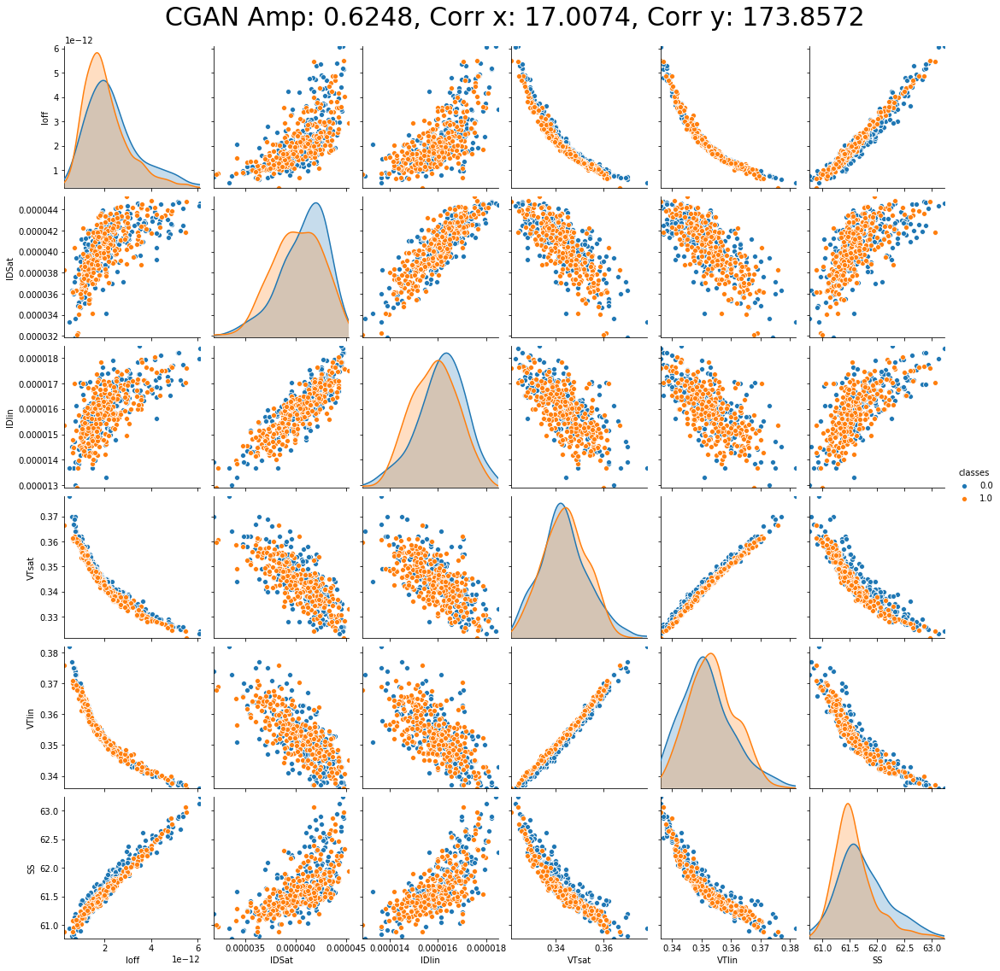

factor 1
232 521
Generated sample shape: (250, 6)
real sample shape: (289, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (289, 1)
minimum y value for each varaible: [3.12849323e-13 3.14407042e-05 1.32262761e-05 3.24000000e-01
 3.36000000e-01 6.07870310e+01 0.00000000e+00]
maximum y value for each varaible: [6.00900000e-12 4.58166627e-05 1.87284263e-05 3.71948122e-01
 3.76739581e-01 6.30910000e+01 1.00000000e+00]
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


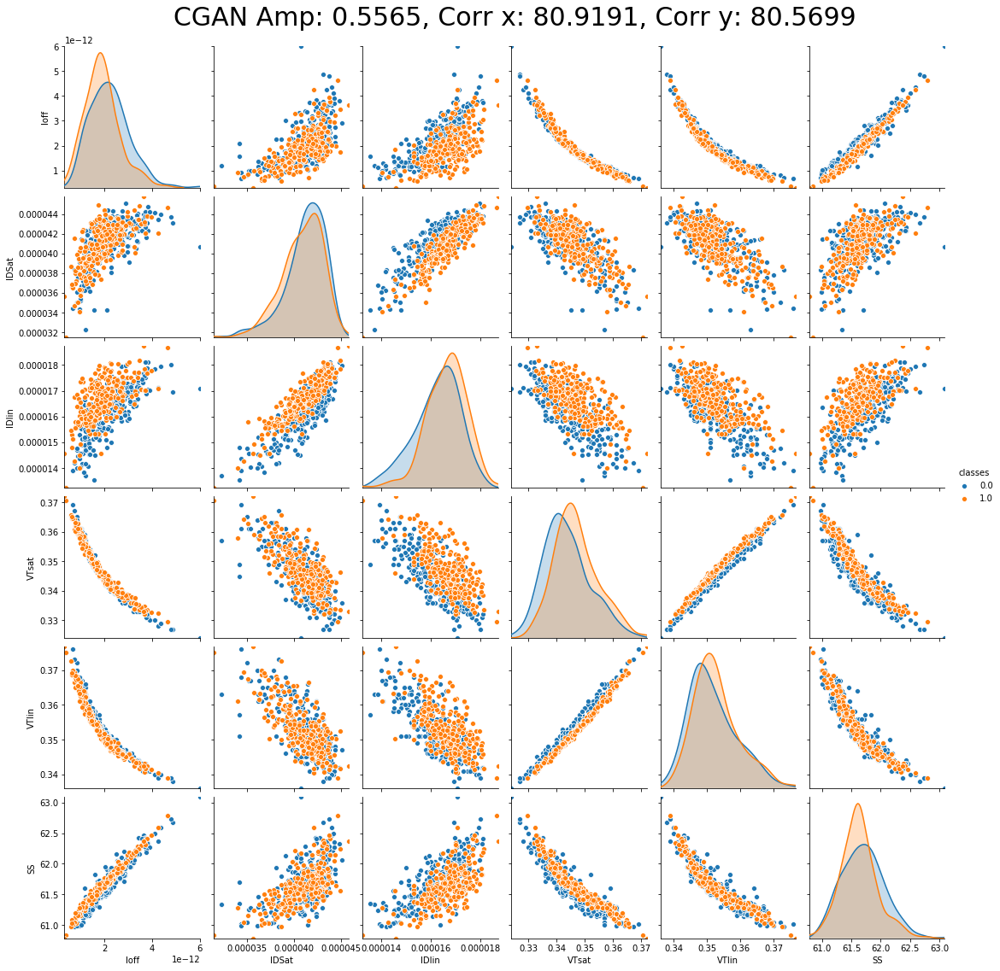

factor 2
521 798
Generated sample shape: (250, 6)
real sample shape: (277, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (277, 1)
minimum y value for each varaible: [5.79447133e-13 3.34900000e-05 1.37300000e-05 3.26000000e-01
 3.38000000e-01 6.08328844e+01 0.00000000e+00]
maximum y value for each varaible: [5.08200000e-12 4.56227564e-05 1.83700000e-05 3.68000000e-01
 3.76005294e-01 6.28320000e+01 1.00000000e+00]
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


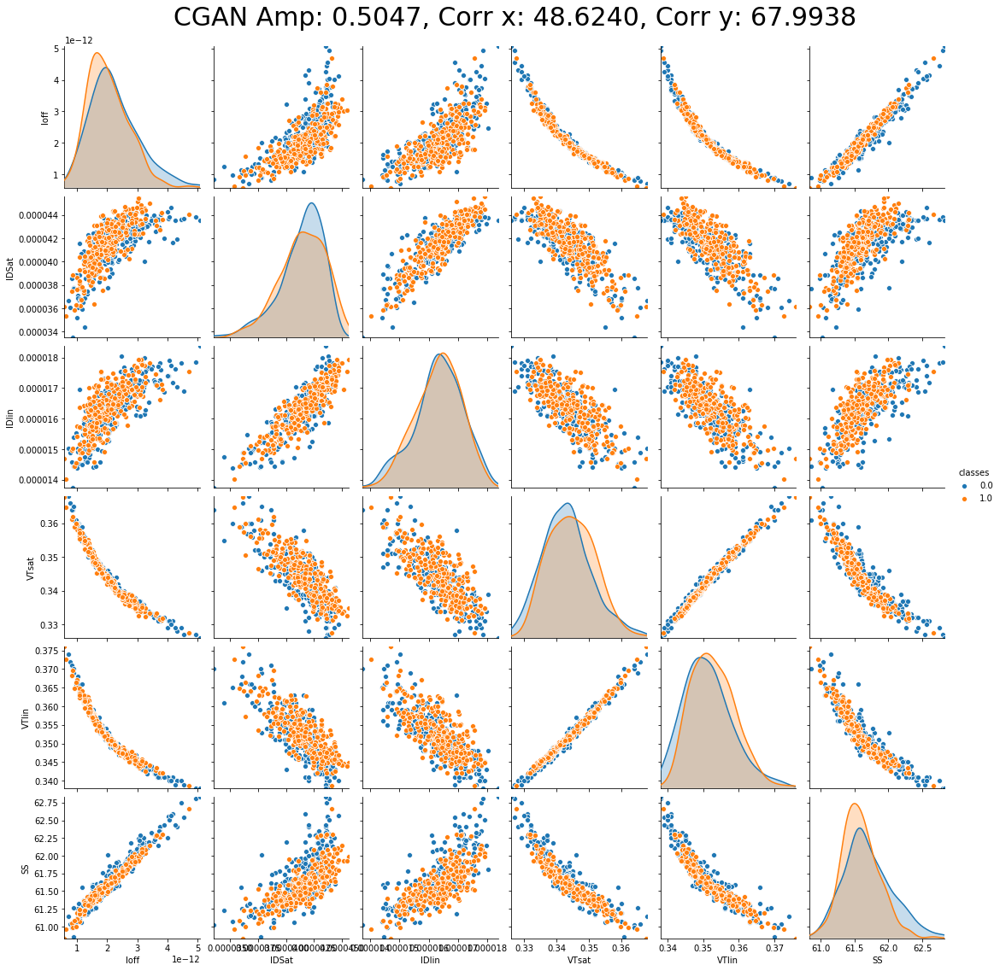

factor 3
798 1051
Generated sample shape: (250, 6)
real sample shape: (253, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (253, 1)
minimum y value for each varaible: [5.03422667e-13 3.16500000e-05 1.29000000e-05 3.18481787e-01
 3.31621490e-01 6.08499433e+01 0.00000000e+00]
maximum y value for each varaible: [6.50957675e-12 4.51492617e-05 1.83078252e-05 3.73000000e-01
 3.78000000e-01 6.33875694e+01 1.00000000e+00]
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


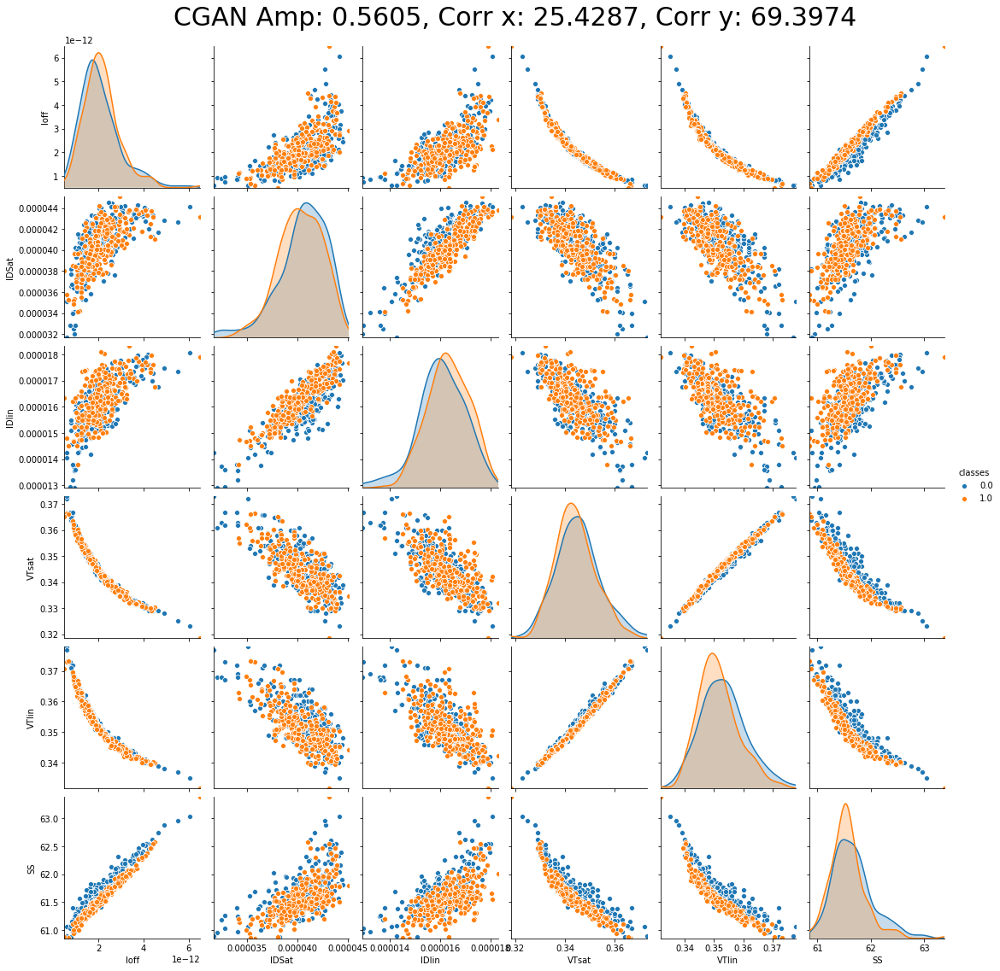

factor 4
1051 1306
Generated sample shape: (250, 6)
real sample shape: (255, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (255, 1)
minimum y value for each varaible: [3.02200000e-13 2.80400000e-05 1.15000000e-05 3.23000000e-01
 3.35000000e-01 6.07638895e+01 0.00000000e+00]
maximum y value for each varaible: [6.11800000e-12 4.56920515e-05 1.86320389e-05 3.94000000e-01
 3.97000000e-01 6.32190000e+01 1.00000000e+00]
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


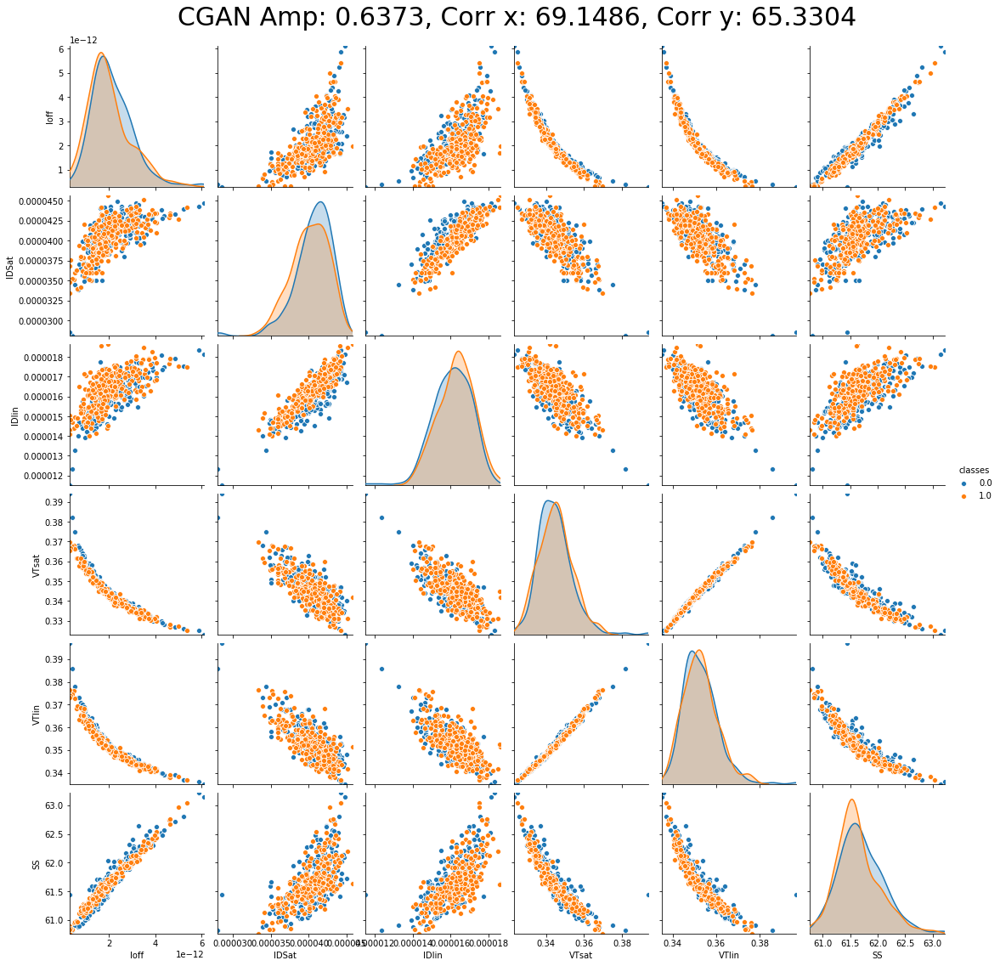

In [103]:
# gen_factor = 7
# test_sample_num = int(total_result_test.shape[0]/15)
# test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]

for factor in range(5):
    
    print("factor", factor)


    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle[:factor]),sum(num_in_cycle[:factor])+num_in_cycle[factor])
    test_gan_matrix_plot = gen_new[factor * gen_new_sample_num:(factor+1)*gen_new_sample_num]
    print("Generated sample shape:", test_gan_matrix_plot.shape)

    # real sample
    test_real_matrix_plot = real_new[sum(num_in_cycle[:factor]):sum(num_in_cycle[:factor])+num_in_cycle[factor]]
    print("real sample shape:", test_real_matrix_plot.shape)
    print()

    # Assigning class(generated: 0, real:1 ) for visualization

    print("Assigning class for visualization (generated: 0, real:1 )")

    test_gan_cls = np.ones((gen_new_sample_num, 1))
    print("generated sample class shape:", test_gan_cls.shape)
    test_real_cls = np.zeros((num_in_cycle[factor], 1))
    print("real sample class shape:", test_real_cls.shape)

    test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)

#    print(df1_test)
    
        # min, max for generated Y value ( used for scatter plot limit standard )

    test_min_list = total_test_matrix_plot.min(axis=0)
    test_max_list = total_test_matrix_plot.max(axis=0)
    print("minimum y value for each varaible:", test_min_list)
    print("maximum y value for each varaible:", test_max_list)

    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.4f}, Corr x: {:.4f}, Corr y: {:.4f}".format(X_test[0], X_test[1], X_test[2]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((test_min_list[i],test_max_list[i]))
        g.axes[i,i].set_ylim((test_min_list[i],test_max_list[i]))
    plt.show()


    ### 파란색이 real 주황색이 generated

# GEN: old / real: old

In [104]:
# result = 'total_date_20201017_data_n_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_150_pdrop_0.8.npy'
result = 'old_test_specificdate_201019_data_2020_LER_20200804_V006.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_250_pdrop_0.8.npy'

gen_old = np.load(result, allow_pickle=True)

gen_old_sample_num = int(gen_old.shape[0]/15)
print(gen_old_sample_num)

print(gen_old.shape)

250
(3750, 6)


In [105]:
file_path = '2020_LER_20200804_V006.xlsx'

data = np.load('../data_handler/'+file_path+'.npy', allow_pickle=True)
num_in_cycle = 50
num_of_cycle = 15
    
X_all, Y_all, X_per_cycle, Y_per_cycle = data[0], data[1], data[2], data[3]
print(data[0].shape, data[1].shape, data[2].shape, data[3].shape)

X_per_cycle = X_per_cycle[100-15:]
real_old = Y_all[num_in_cycle*(100-15):]

print(X_per_cycle.shape)
print(real_old.shape)

for i in range(len(X_per_cycle)):
    print(X_per_cycle[i])

(5000, 5) (5000, 6) (100, 5) (100, 6)
(15, 5)
(750, 6)
[ 0.23382353 12.96637055 90.23879096  1.          0.        ]
[  0.30427565  66.71708105 100.38505182   1.           0.        ]
[  0.62484672  17.00743225 173.85718891   1.           0.        ]
[ 0.55654727 80.91905766 80.56986979  1.          0.        ]
[ 0.24570047 55.00833759 53.74319497  1.          0.        ]
[  0.16229525  93.67933473 152.38238496   1.           0.        ]
[  0.36254233  77.8518127  162.43150869   1.           0.        ]
[ 0.50466944 48.62398816 67.99380535  1.          0.        ]
[  0.1464667   57.13501835 113.61622669   1.           0.        ]
[  0.34769517  76.83029982 105.47628163   1.           0.        ]
[ 0.11484396 82.62015719 61.14546297  1.          0.        ]
[  0.44843667  12.72536213 116.47528906   1.           0.        ]
[ 0.56045148 25.42868151 69.39740975  1.          0.        ]
[  0.17704548  96.40687047 145.81213053   1.           0.        ]
[ 0.63730798 69.14860261 65.33037708 

factor 0
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.14114394e-12 3.90224383e-05 1.51247809e-05 3.33401371e-01
 3.43000000e-01 6.12747860e+01 0.00000000e+00]
maximum y value for each varaible: [3.20400000e-12 4.47900473e-05 1.75597655e-05 3.56111356e-01
 3.63242452e-01 6.20310000e+01 1.00000000e+00]
X input [ 0.23382353 12.96637055 90.23879096  1.          0.        ]


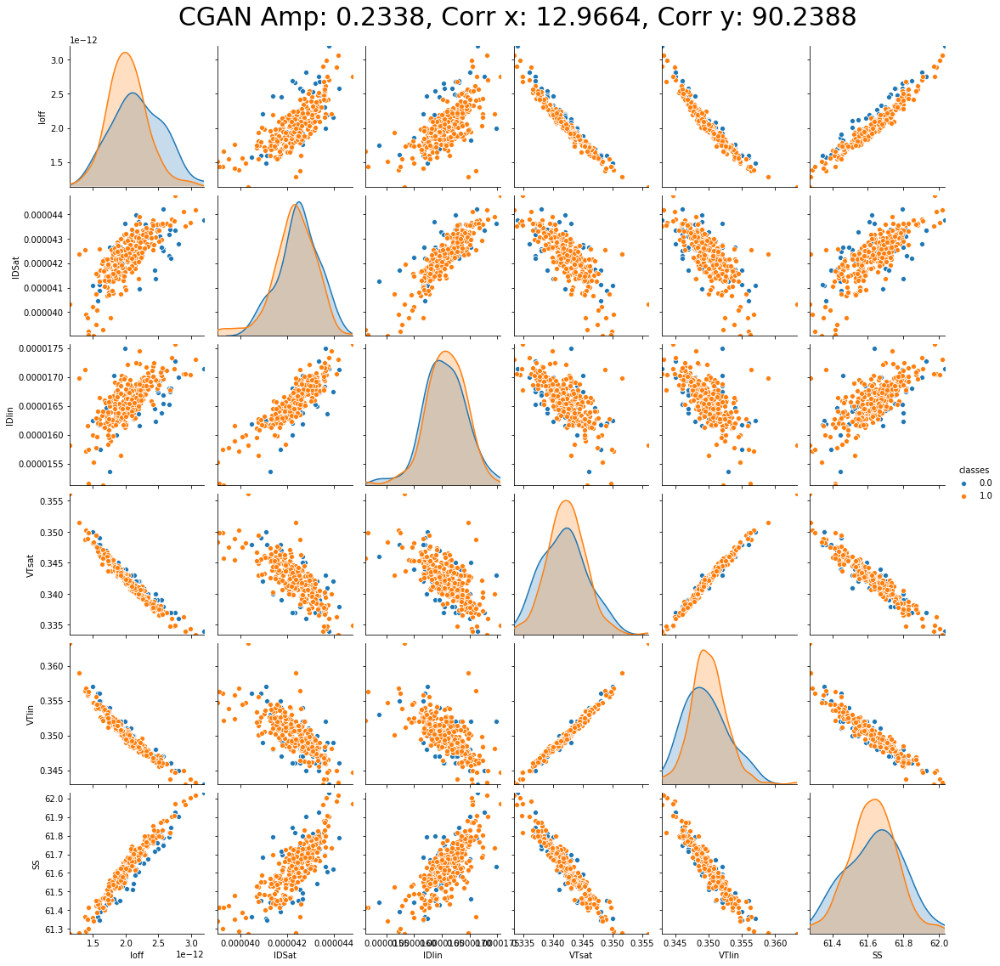

factor 1
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.1260e-12 3.8420e-05 1.5180e-05 3.2800e-01 3.3800e-01 6.1062e+01
 0.0000e+00]
maximum y value for each varaible: [4.47900000e-12 4.43698007e-05 1.79077254e-05 3.56000000e-01
 3.63000000e-01 6.25370473e+01 1.00000000e+00]
X input [  0.30427565  66.71708105 100.38505182   1.           0.        ]


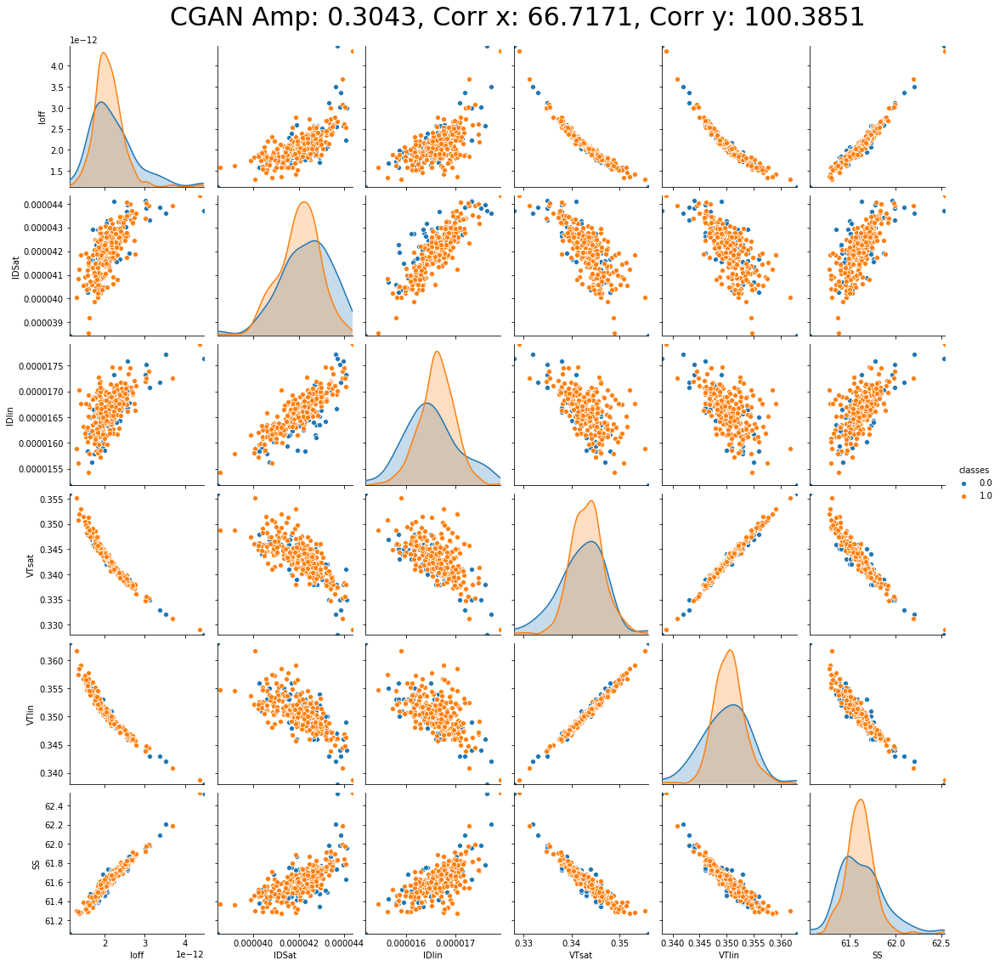

factor 2
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [-1.73240252e-14  3.18200000e-05  1.29483292e-05  3.20277395e-01
  3.34124060e-01  6.06642318e+01  0.00000000e+00]
maximum y value for each varaible: [5.94896033e-12 4.58616738e-05 1.82100000e-05 3.73930171e-01
 3.82476452e-01 6.31986163e+01 1.00000000e+00]
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


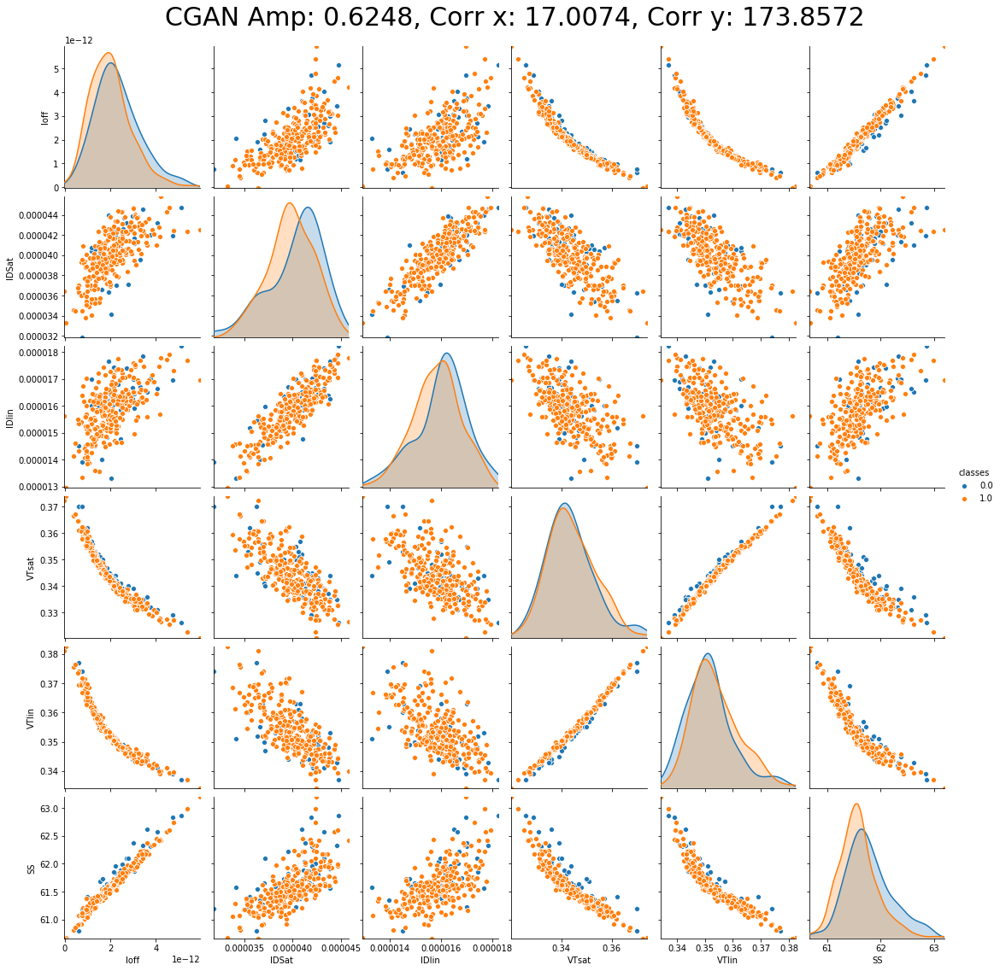

factor 3
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.11774107e-13 3.22400000e-05 1.35500000e-05 3.30945736e-01
 3.39639464e-01 6.07514865e+01 0.00000000e+00]
maximum y value for each varaible: [4.29534647e-12 4.50254567e-05 1.89699455e-05 3.73120792e-01
 3.79674078e-01 6.26358379e+01 1.00000000e+00]
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


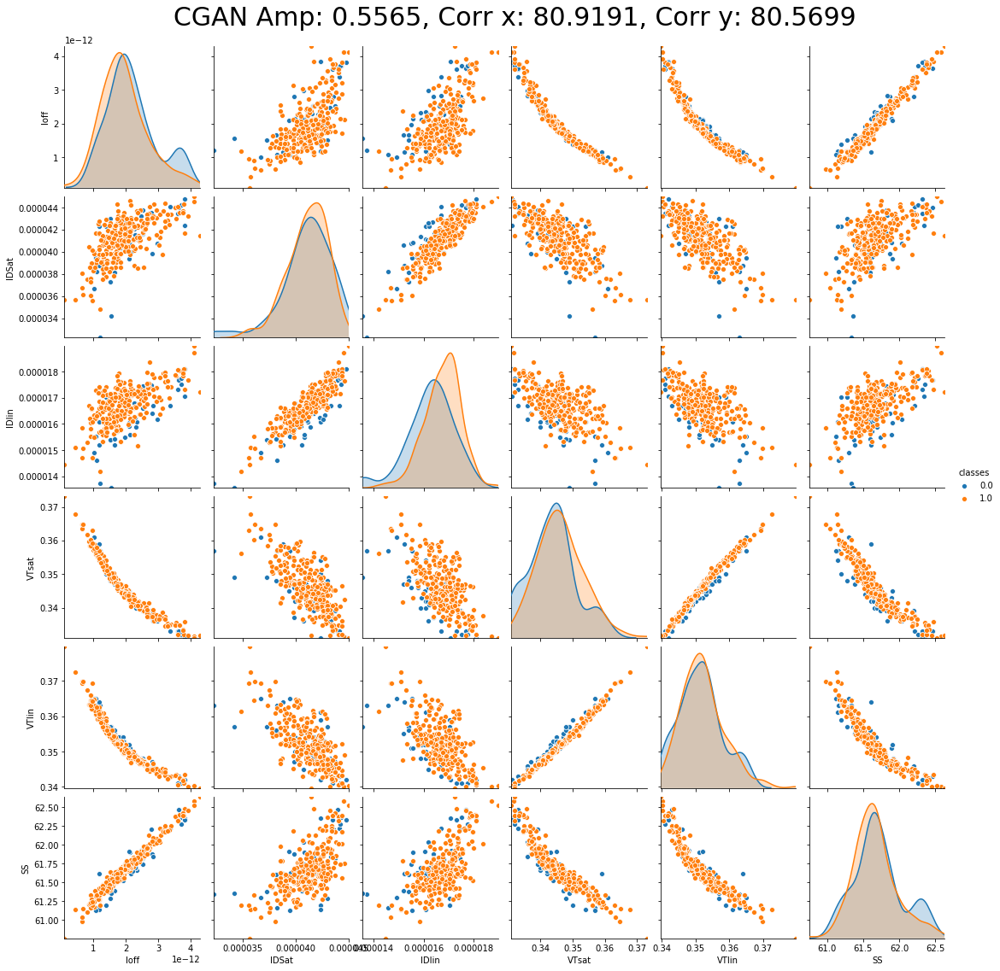

factor 4
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.39300000e-12 3.92702804e-05 1.49284873e-05 3.31203055e-01
 3.41424121e-01 6.11145820e+01 0.00000000e+00]
maximum y value for each varaible: [3.38973546e-12 4.46749736e-05 1.74500000e-05 3.54169327e-01
 3.61005455e-01 6.19974871e+01 1.00000000e+00]
X input [ 0.24570047 55.00833759 53.74319497  1.          0.        ]


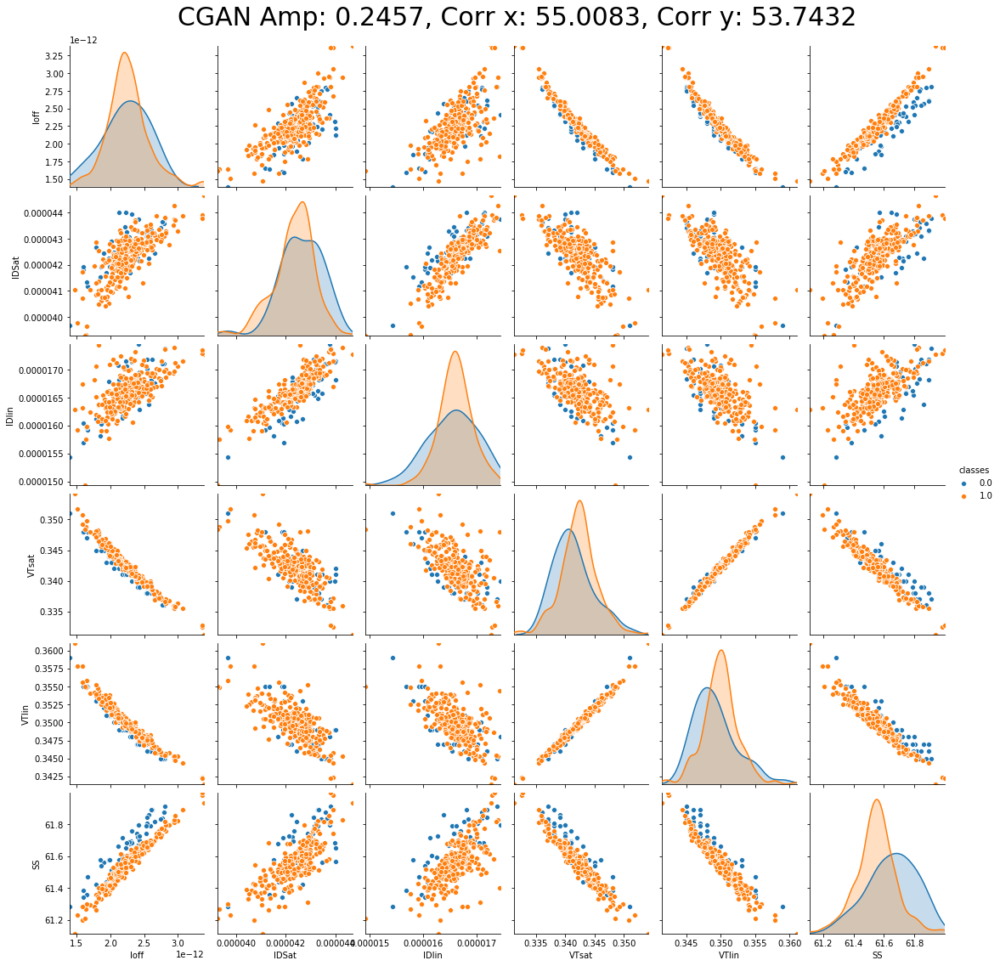

factor 5
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.72000000e-12 4.07183575e-05 1.59002111e-05 3.34523106e-01
 3.44000000e-01 6.13773235e+01 0.00000000e+00]
maximum y value for each varaible: [2.91600000e-12 4.39997230e-05 1.72842396e-05 3.46212217e-01
 3.54826359e-01 6.19200000e+01 1.00000000e+00]
X input [  0.16229525  93.67933473 152.38238496   1.           0.        ]


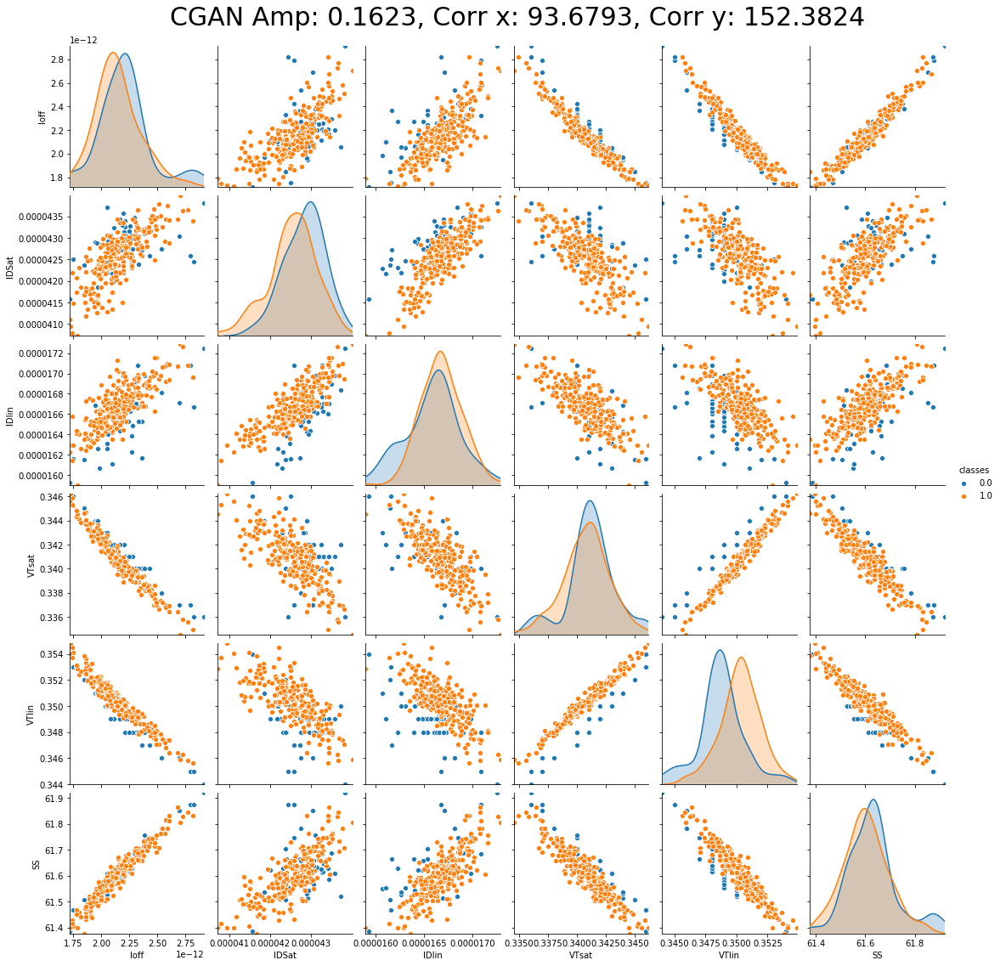

factor 6
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.21460010e-12 3.77875285e-05 1.49700000e-05 3.28795873e-01
 3.37395863e-01 6.12150000e+01 0.00000000e+00]
maximum y value for each varaible: [3.96966083e-12 4.48793943e-05 1.79122244e-05 3.53972404e-01
 3.59581349e-01 6.23846515e+01 1.00000000e+00]
X input [  0.36254233  77.8518127  162.43150869   1.           0.        ]


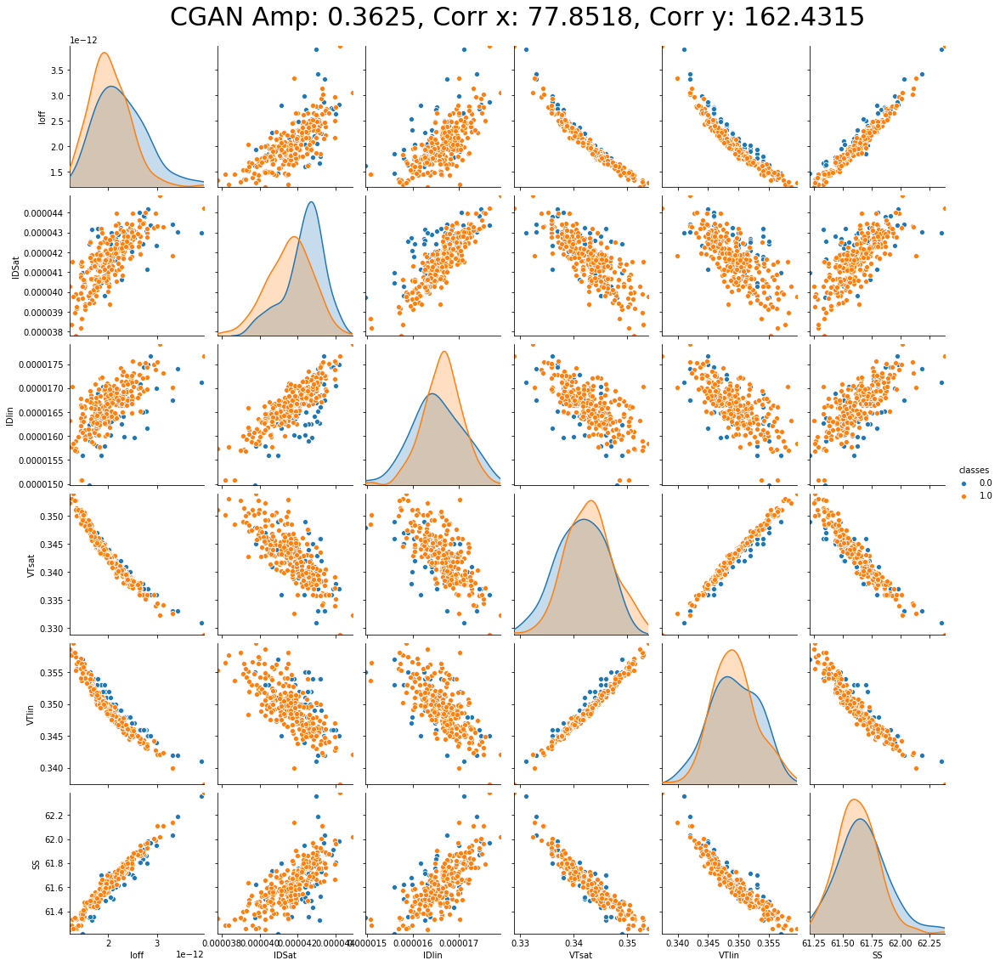

factor 7
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [6.05938808e-13 3.39969133e-05 1.39561207e-05 3.22230286e-01
 3.34493156e-01 6.09278493e+01 0.00000000e+00]
maximum y value for each varaible: [6.04336410e-12 4.58563529e-05 1.83818726e-05 3.67853539e-01
 3.75116458e-01 6.33420900e+01 1.00000000e+00]
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


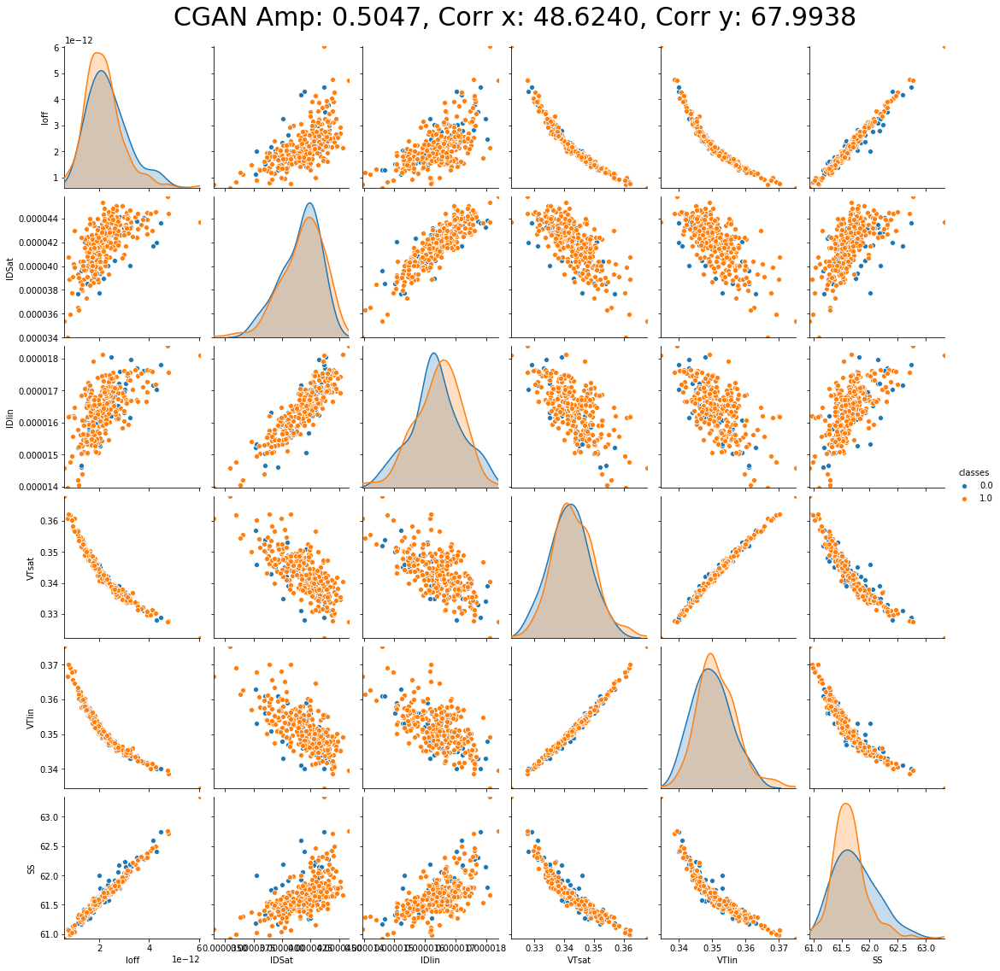

factor 8
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.68304109e-12 3.89398510e-05 1.55788471e-05 3.33307290e-01
 3.41119049e-01 6.12306873e+01 0.00000000e+00]
maximum y value for each varaible: [3.36803799e-12 4.49968508e-05 1.76545258e-05 3.49587201e-01
 3.53799932e-01 6.19544387e+01 1.00000000e+00]
X input [  0.1464667   57.13501835 113.61622669   1.           0.        ]


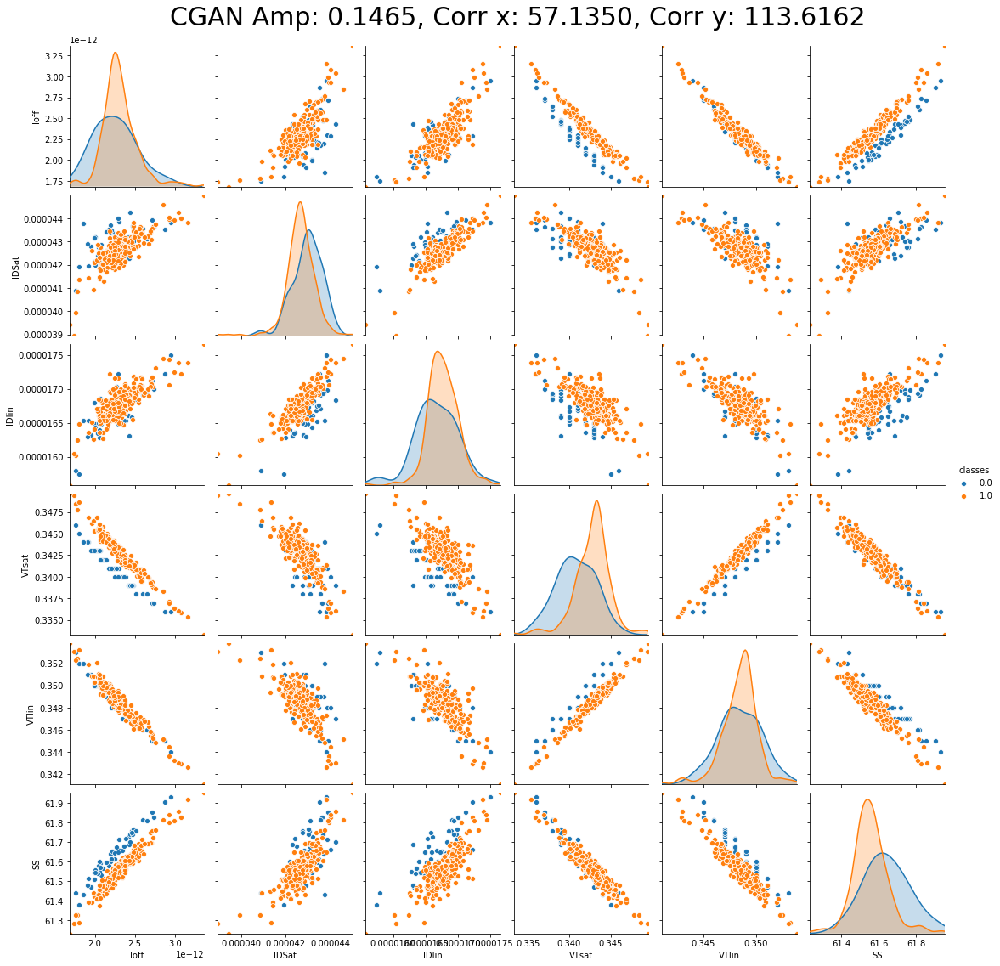

factor 9
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.04519261e-12 3.70825221e-05 1.51981021e-05 3.32637133e-01
 3.42000000e-01 6.10901565e+01 0.00000000e+00]
maximum y value for each varaible: [3.37000000e-12 4.45636803e-05 1.76798174e-05 3.58319343e-01
 3.64314403e-01 6.21730000e+01 1.00000000e+00]
X input [  0.34769517  76.83029982 105.47628163   1.           0.        ]


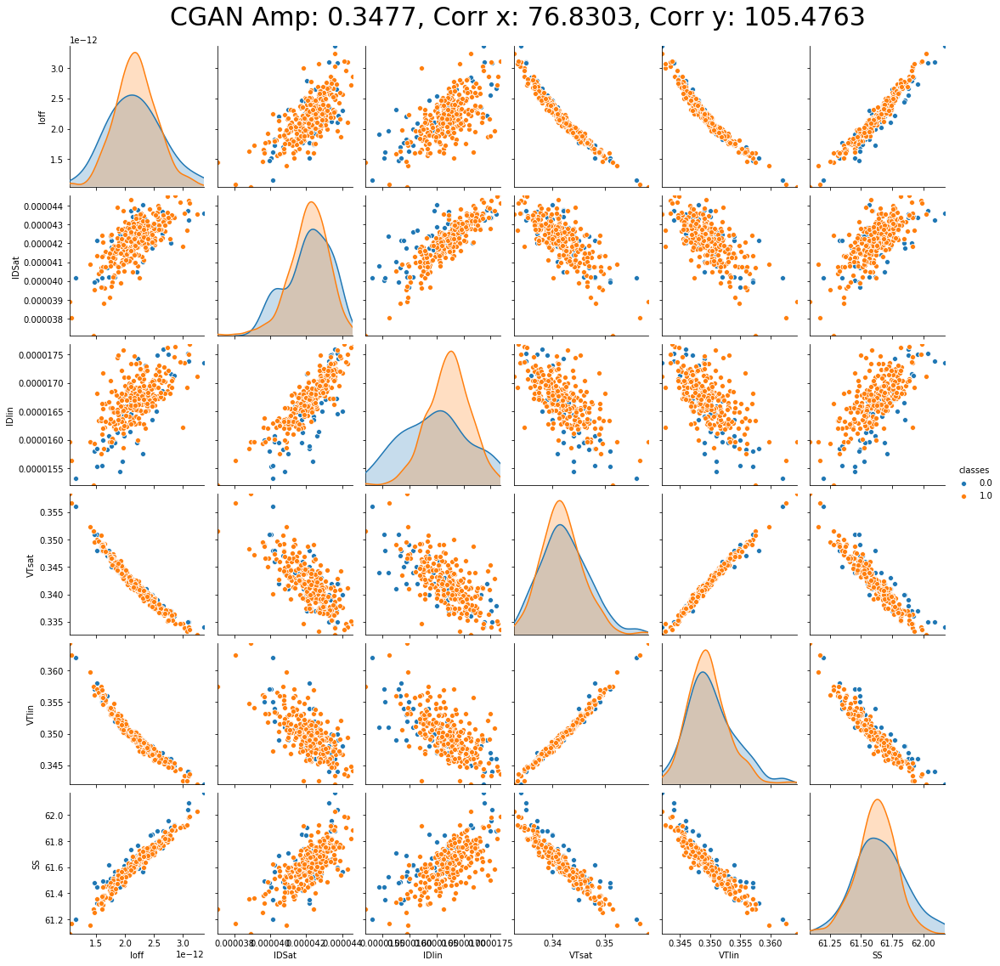

factor 10
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.64423550e-12 4.02811958e-05 1.61307568e-05 3.35660552e-01
 3.43552568e-01 6.13879218e+01 0.00000000e+00]
maximum y value for each varaible: [2.75514847e-12 4.39500000e-05 1.73500000e-05 3.47889148e-01
 3.54036700e-01 6.18625905e+01 1.00000000e+00]
X input [ 0.11484396 82.62015719 61.14546297  1.          0.        ]


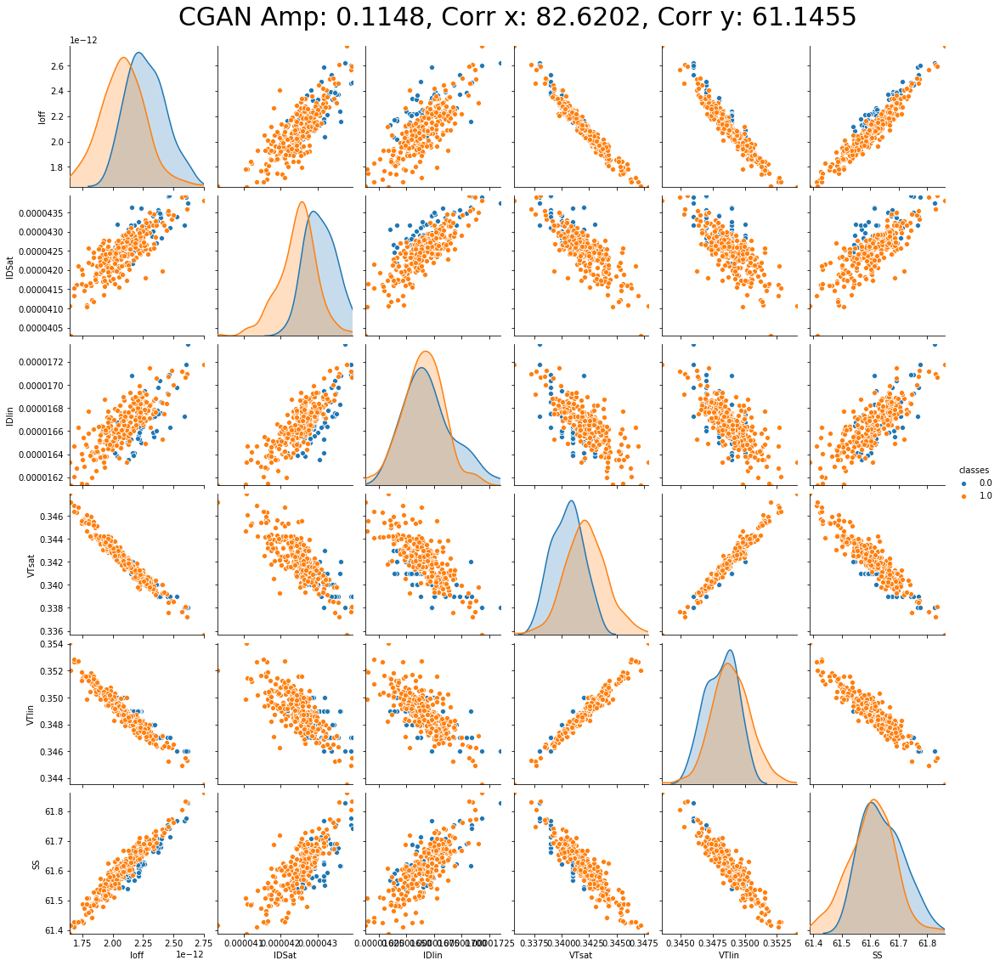

factor 11
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [9.30491626e-13 3.59592634e-05 1.47500000e-05 3.26903991e-01
 3.39067576e-01 6.10890000e+01 0.00000000e+00]
maximum y value for each varaible: [4.56765626e-12 4.43376445e-05 1.83584494e-05 3.59478558e-01
 3.66644667e-01 6.27268425e+01 1.00000000e+00]
X input [  0.44843667  12.72536213 116.47528906   1.           0.        ]


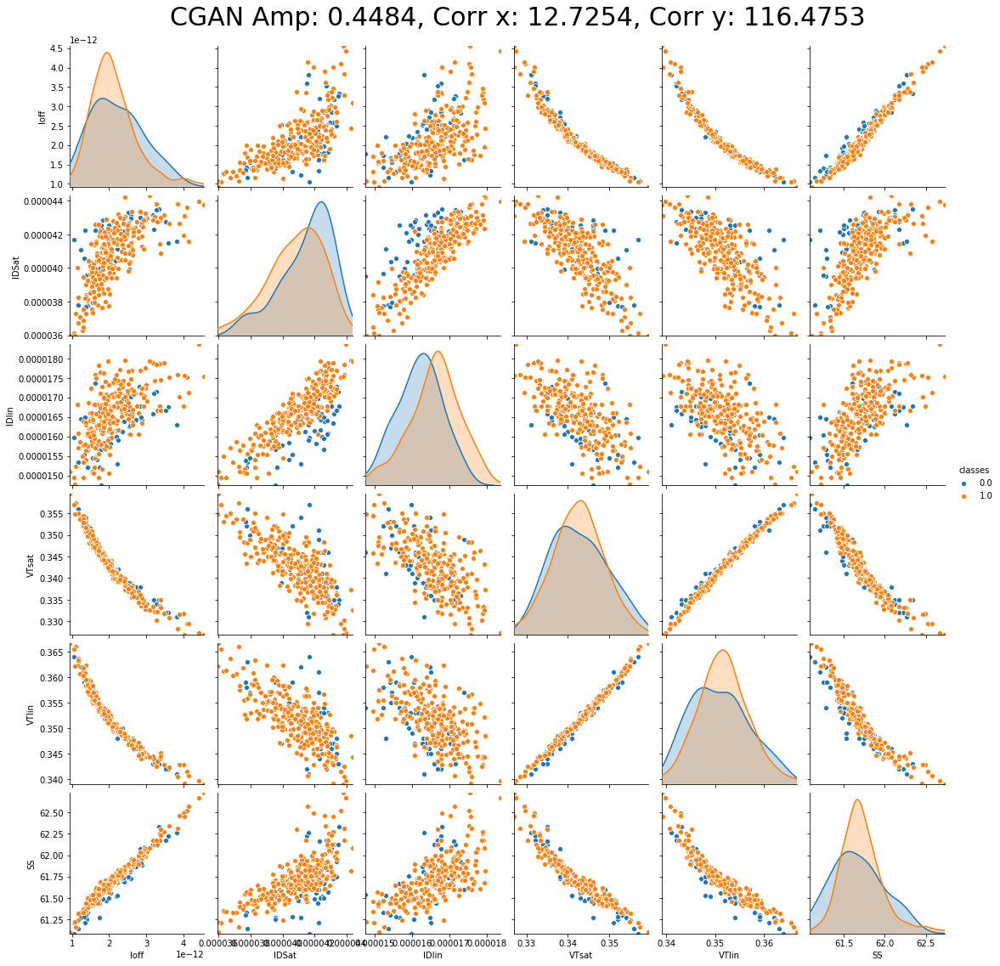

factor 12
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [3.46258772e-13 3.20500000e-05 1.29000000e-05 3.26682567e-01
 3.36668325e-01 6.06550503e+01 0.00000000e+00]
maximum y value for each varaible: [4.90800000e-12 4.49042825e-05 1.84684773e-05 3.71441212e-01
 3.77641445e-01 6.28780000e+01 1.00000000e+00]
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


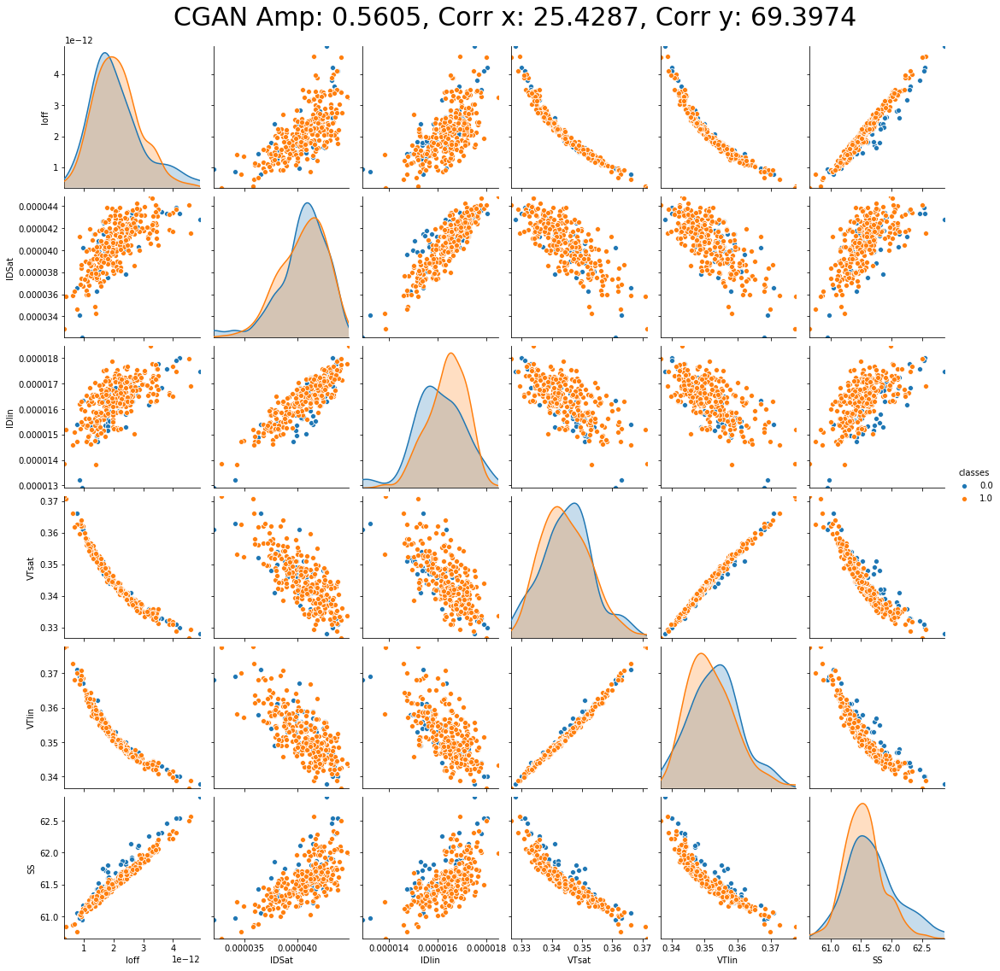

factor 13
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [1.54500000e-12 4.08539107e-05 1.56500000e-05 3.32200785e-01
 3.43764471e-01 6.13458085e+01 0.00000000e+00]
maximum y value for each varaible: [3.07466996e-12 4.41021251e-05 1.74000000e-05 3.49000000e-01
 3.56753455e-01 6.19727105e+01 1.00000000e+00]
X input [  0.17704548  96.40687047 145.81213053   1.           0.        ]


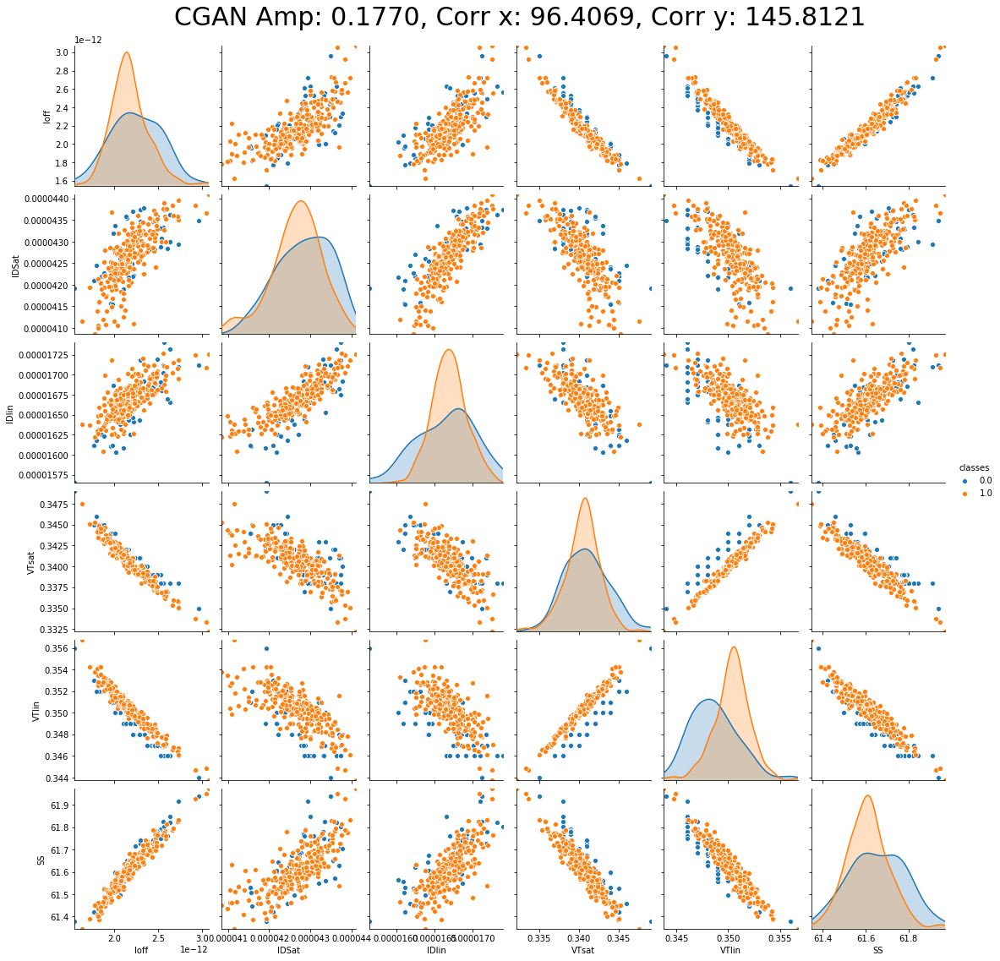

factor 14
Generated sample shape: (250, 6)
real sample shape: (50, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (50, 1)
minimum y value for each varaible: [3.49962480e-13 3.36982110e-05 1.39851938e-05 3.26000000e-01
 3.37000000e-01 6.09028817e+01 0.00000000e+00]
maximum y value for each varaible: [5.21800000e-12 4.52013845e-05 1.86585523e-05 3.68611190e-01
 3.76432169e-01 6.29425339e+01 1.00000000e+00]
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


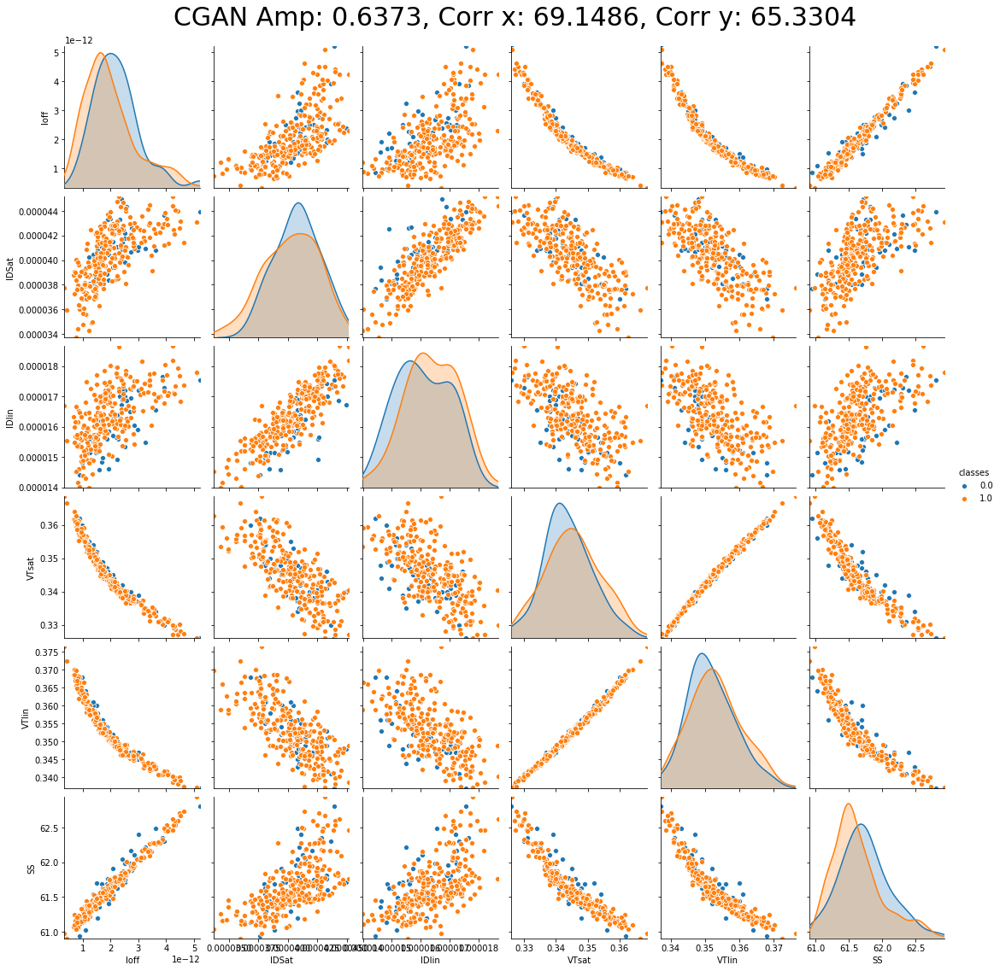

In [106]:
# gen_factor = 7
# test_sample_num = int(total_result_test.shape[0]/15)
# test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]

for factor in range(15):
    
    print("factor", factor)


    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    test_gan_matrix_plot = gen_old[factor * gen_old_sample_num:(factor+1)*gen_old_sample_num]
    print("Generated sample shape:", test_gan_matrix_plot.shape)

    # real sample
    test_real_matrix_plot = real_old[factor * num_in_cycle:(factor+1)*num_in_cycle]
    print("real sample shape:", test_real_matrix_plot.shape)
    print()

    # Assigning class(generated: 0, real:1 ) for visualization

    print("Assigning class for visualization (generated: 0, real:1 )")

    test_gan_cls = np.ones((gen_old_sample_num, 1))
    print("generated sample class shape:", test_gan_cls.shape)
    test_real_cls = np.zeros((num_in_cycle, 1))
    print("real sample class shape:", test_real_cls.shape)

    test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)

#    print(df1_test)
    
        # min, max for generated Y value ( used for scatter plot limit standard )

    test_min_list = total_test_matrix_plot.min(axis=0)
    test_max_list = total_test_matrix_plot.max(axis=0)
    print("minimum y value for each varaible:", test_min_list)
    print("maximum y value for each varaible:", test_max_list)

    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.4f}, Corr x: {:.4f}, Corr y: {:.4f}".format(X_test[0], X_test[1], X_test[2]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((test_min_list[i],test_max_list[i]))
        g.axes[i,i].set_ylim((test_min_list[i],test_max_list[i]))
    plt.show()


    ### 파란색이 real 주황색이 generated

# GEN: old / REAL: new

In [107]:
# result = 'total_date_20201017_data_n_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_150_pdrop_0.8.npy'
result = 'old_test_specificdate_201019_data_2020_LER_20200804_V006.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_100_batch_size_32_epoch_1000_200_noise_d_100_sample_num_250_pdrop_0.8.npy'

gen_old = np.load(result, allow_pickle=True)

gen_old_sample_num = int(gen_old.shape[0]/15)
print(gen_old_sample_num)

print(gen_old.shape)

250
(3750, 6)


In [108]:
file_path = '2020_LER_20200922_testset.xlsx'

data = np.load('../data_handler/'+file_path+'.npy', allow_pickle=True)
num_in_cycle = [232, 289, 277, 253, 255] 
num_of_cycle = 5
    
X_all, Y_all, X_per_cycle, Y_per_cycle = data[0], data[1], data[2], data[3]
print(data[0].shape, data[1].shape, data[2].shape, data[3].shape)

real_new = Y_all

print(real_new.shape)

for i in range(len(X_per_cycle)):
    print(X_per_cycle[i])

(1306, 5) (1306, 6) (5, 5) (5, 6)
(1306, 6)
[  0.62484672  17.00743225 173.85718891   1.           0.        ]
[ 0.55654727 80.91905766 80.56986979  1.          0.        ]
[ 0.50466944 48.62398816 67.99380535  1.          0.        ]
[ 0.56045148 25.42868151 69.39740975  1.          0.        ]
[ 0.63730798 69.14860261 65.33037708  1.          0.        ]


Generated sample shape: (250, 6)
real sample shape: (277, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (277, 1)
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]
minimum y value for each varaible: [6.05938808e-13 3.34900000e-05 1.37300000e-05 3.22230286e-01
 3.34493156e-01 6.08530000e+01 0.00000000e+00]
maximum y value for each varaible: [6.04336410e-12 4.58563529e-05 1.83818726e-05 3.68000000e-01
 3.75116458e-01 6.33420900e+01 1.00000000e+00]
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


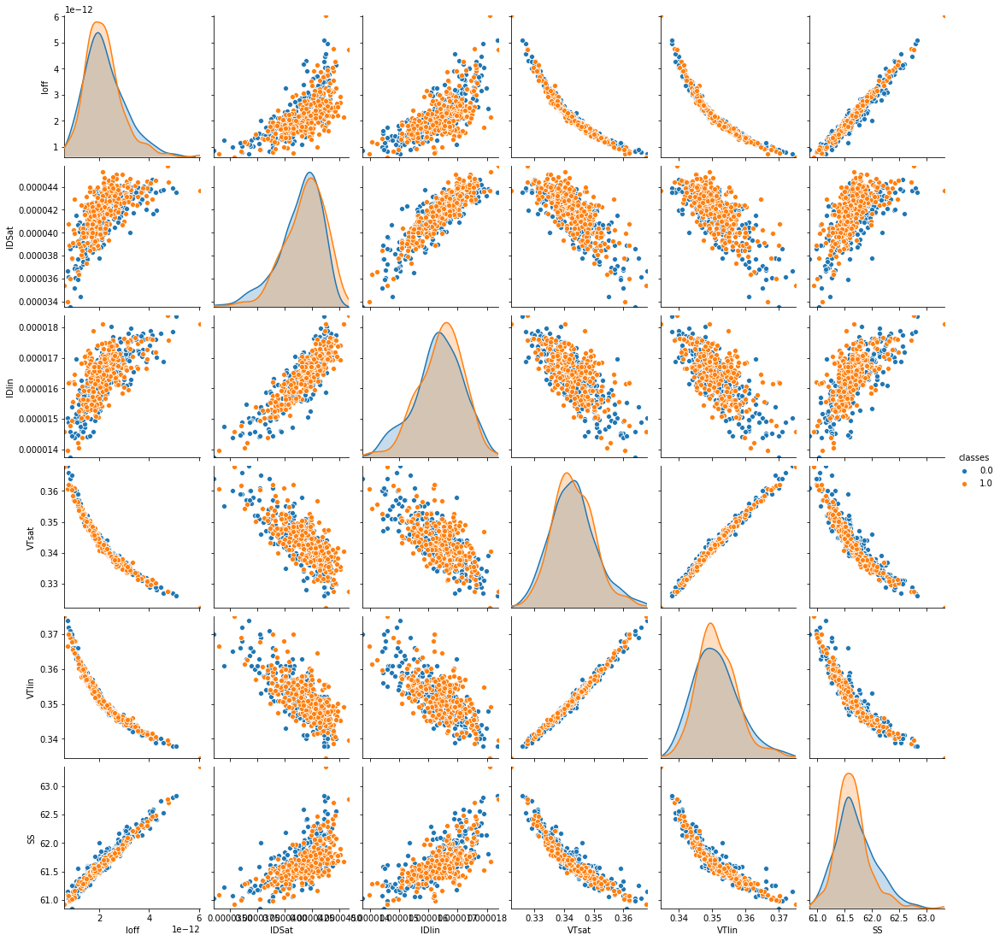

In [109]:
gen_factor = 7
real_factor = 2

test_gan_matrix_plot = gen_old[gen_factor * gen_old_sample_num:(gen_factor+1)*gen_old_sample_num]

# gen_factor = 2
# test_sample_num = int(total_result_test.shape[0]/5)
# test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]
print("Generated sample shape:", test_gan_matrix_plot.shape)

# test_real_matrix_plot = real_test[sum(num_in_cycle[:real_factor]):sum(num_in_cycle[:real_factor])+num_in_cycle[real_factor]]
test_real_matrix_plot = real_new[sum(num_in_cycle[:real_factor]):sum(num_in_cycle[:real_factor])+num_in_cycle[real_factor]]
print("real sample shape:", test_real_matrix_plot.shape)
print()

# Assigning class(generated: 0, real:1 ) for visualization

print("Assigning class for visualization (generated: 0, real:1 )")

test_gan_cls = np.ones((gen_old_sample_num, 1))
print("generated sample class shape:", test_gan_cls.shape)
# test_real_cls = np.zeros((num_in_cycle[real_factor], 1))
test_real_cls = np.zeros((num_in_cycle[real_factor], 1))
print("real sample class shape:", test_real_cls.shape)


test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    
test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    
# TOTAL PANDAS DATA
    
total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    
# print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)

#    print(df1_test)
    
X_test = X_per_cycle[real_factor]

print("X input", X_test)        # min, max for generated Y value ( used for scatter plot limit standard )

test_min_list = total_test_matrix_plot.min(axis=0)
test_max_list = total_test_matrix_plot.max(axis=0)
print("minimum y value for each varaible:", test_min_list)
print("maximum y value for each varaible:", test_max_list)

print("X input", X_test)


g = sns.pairplot(df1_test, hue = 'classes')
for i in range(6):
    g.axes[i,i].set_xlim((test_min_list[i],test_max_list[i]))
    g.axes[i,i].set_ylim((test_min_list[i],test_max_list[i]))
plt.show()